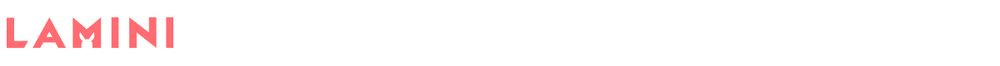

# Introduction

This course covers :

- How to use LLMs on my own data or tasks?
- How to prompt a large language model?
- How to train an open source LLM and further train it on out data?

Writing a prompt is a pretty good approach to get LLM in some tasks like **key words extraction**  or **classify text**, but by fine tuining the LLM we can get much more than that. Fine tuning also adjust LLM tune.

Training a LLM is quite expensive and it needs Billion billions data and needs massive GPU resources, but via doing fine tuning, we can get **get an existing LLM and further train it on our data**.


Provided by Lamini team - Sharon Zhou

# Why finetune
https://learn.deeplearning.ai/finetuning-large-language-models/lesson/2/why-finetune

In [1]:
# @title Step 1: Authenticate with Google
# @markdown Note: You will be asked to sign in with Google, connected to your Lamini account.

from google.colab import auth
import requests
import os
import yaml

def authenticate_powerml():
  auth.authenticate_user()
  gcloud_token = !gcloud auth print-access-token
  powerml_token_response = requests.get('https://api.powerml.co/v1/auth/verify_gcloud_token?token=' + gcloud_token[0])
  print(powerml_token_response)
  return powerml_token_response.json()['token']

key = authenticate_powerml()

config = {
    "production": {
        "key": key,
        "url": "https://api.powerml.co"
    }
}

keys_dir_path = '/root/.powerml'
os.makedirs(keys_dir_path, exist_ok=True)

keys_file_path = keys_dir_path + '/configure_llama.yaml'
with open(keys_file_path, 'w') as f:
  yaml.dump(config, f, default_flow_style=False)


<Response [200]>


In [3]:
# @title Step 2: Install the open-source [Lamini library](https://pypi.org/project/lamini/) to use LLMs easily
# @markdown Note: After installing, click the "RESTART RUNTIME" button at the end of the output, then go onto the next cell.
# @markdown Lamini is just on a more recent version of numpy than Colab.
!pip install --upgrade --force-reinstall --ignore-installed lamini

## How to use LLMs for a specefic task?
We know how to prompt over a large language models, now we are gonna learn how to fine tune them. means, how to take an open source LLM and train it on our own data. With prompt it is good to follow some tasks, like extracting key words or classify tasks, or sentiment analysis, but with LLM we can do more consistency what we want. also we can adjust LLM tune.  Training a LLM is a very costy and GPU/time,... consuming, but we can fine-tune them on our own data. 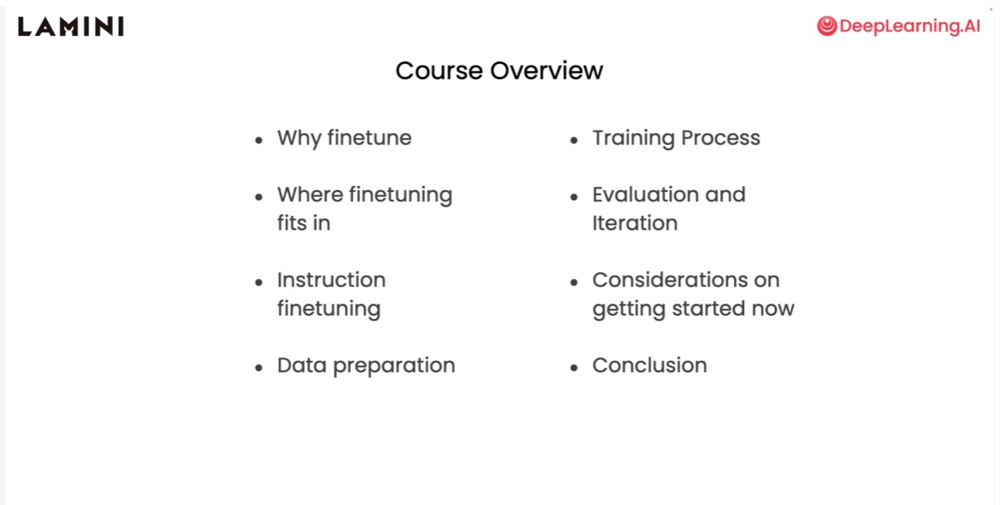

🚨 Note: After installing, click the "RESTART RUNTIME" button at the end of the output, then go onto the next cell.
Lamini is just on a more recent version of numpy than Colab.


# Compare finetuned vs. non-finetuned LLMs

Why we do fine tunning?
First, you can import `BasicModelRunner` from the [Lamini library](https://lamini-ai.github.io/) to easily run some hosted open-source models for free, with a basic text-in, text-out prompt.

This is so you can compare performance on a couple popular LLMs, running fast on GPUs.

But what is fine tuning?
As could be find from below, it means taking a general purpose LLM like GPT-3 and specialize them into something like ChatGPT, that is well capable of doing Chating stuff. or taking a Primary care Position (PCP) that is more for general yearly check up and turn it into a specialist in some specific areas.

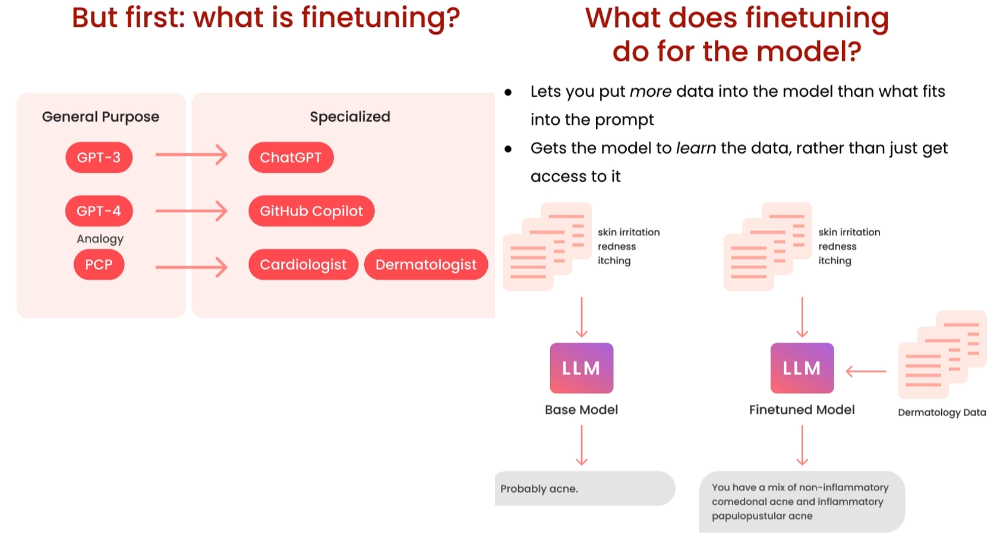

In addition to learning new information, fine-tuning can also helps through the model, to more consistent output or behaviour. Like below example.

So in fine tuning, our model learn data rather than simply having access to the data. Base model is very general but fine-tuned model is much more task specific. like the last example.

Finetuning vs. prompting?

- RAG: Retrieval Augmented Generation. Means to connect more data and selectively chose which part goes into the prompt. Although RAG still can miss some data or get incorrect data.
- **Hallucinations** in prompting means it is hard to correct the incorrect information that is already learned.
- In finetuniing we can correct incorrect information or even learn new knowledges that have not been trained before.
- Finetuning also supports RAG to connect more data into it.

**Generally speaking: ** Prompting is great for generic tasks, and to start some side projects really really fast. But Finetuning is great for more domain-specific and production usecases. Also in finetuning because you end with having your own LLM, it can have far more performance and consistancy in my own domain. Also it is better for moderating. For example, sometimes ChatGPT says, I cannot respond to that. we can make our own LLM to respond even them. for example, issues related to my own company. It learned while it is quite private.

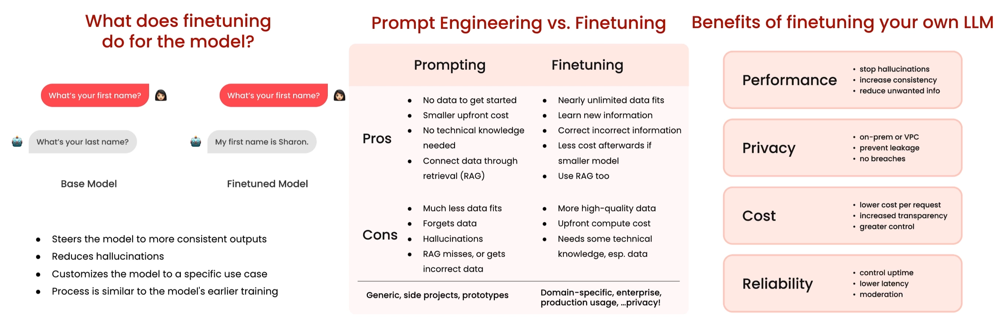

There are 3 different python libraries used here:
1. Pytorch: developed by meta. The lowest level interface.
2. Huggingface: Build on top of pytorch. much higher level. we can import dataset, train model very easily.
3. Llama library: develped by Lamini team. It is the even higher level interface, where we can train our model in 3 lines of codes.

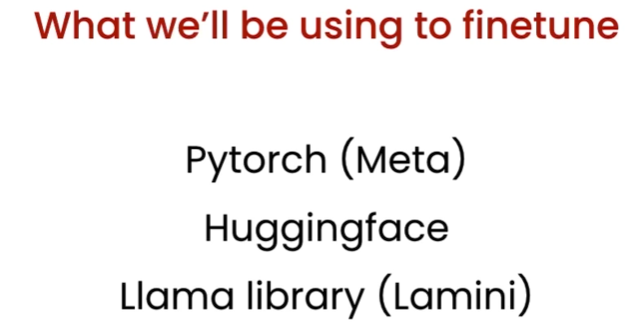

## Lab 1: Compare finetuned vs non-finetuned open-source models

**Llama 2 LLMs, using [Lamini](https://www.lamini.ai/)**

- See the base Llama 2 struggle with various requests
- See the finetuned Llama 2 for chat be able to handle requests much better
- Learn prompt templates that finetuned Llama 2 uses, and do it super easily with `LlamaV2Runner` in Lamini.

It's completely free to run.

In [1]:
from llama import BasicModelRunner

Next, you can load models from [HuggingFace](https://huggingface.co/), where open-source models are hosted.

Llama 2 from Meta is all the rage!

The `meta-llama/Llama-2-7b-hf` model is the base model that hasn't been finetuned yet. This means it's learned basic langauge from the internet and can auto-complete English sentences, but it hasn't learned that it should consistently follow instructions when you tell it to.

In [2]:
non_finetuned = BasicModelRunner("meta-llama/Llama-2-7b-hf")

You can run the model on an input, like this:

In [3]:
non_finetuned_output = non_finetuned("Tell me how to train my dog to sit")
print(non_finetuned_output)

.
Tell me how to train my dog to sit. I have a 10 month old puppy and I want to train him to sit. I have tried the treat method and he just sits there and looks at me like I am crazy. I have tried the "sit" command and he just looks at me like I am crazy. I have tried the "sit" command and he just looks at me like I am crazy. I have tried the "sit" command and he just looks at me like I am crazy. I have tried the "sit" command and he just looks at me like I am crazy. I have tried the "sit" command and he just looks at me like I am crazy. I have tried the "sit" command and he just looks at me like I am crazy. I have tried the "sit" command and he just looks at me like I am crazy. I have tried the "sit" command and he just looks at me like I am crazy. I have tried the "sit" command and he just looks at me like I am crazy. I have tried the "sit" command and he just looks


In [4]:
print(non_finetuned("Tell me how to train my dog to sit"))

.
Tell me how to train my dog to sit. I have a 10 month old puppy and I want to train him to sit. I have tried the treat method and he just sits there and looks at me like I am crazy. I have tried the "sit" command and he just looks at me like I am crazy. I have tried the "sit" command and he just looks at me like I am crazy. I have tried the "sit" command and he just looks at me like I am crazy. I have tried the "sit" command and he just looks at me like I am crazy. I have tried the "sit" command and he just looks at me like I am crazy. I have tried the "sit" command and he just looks at me like I am crazy. I have tried the "sit" command and he just looks at me like I am crazy. I have tried the "sit" command and he just looks at me like I am crazy. I have tried the "sit" command and he just looks at me like I am crazy. I have tried the "sit" command and he just looks


Well, that's a disaster.

In [5]:
print(non_finetuned("What do you think of Mars?"))

I think it's a great planet.
I think it's a great planet. I think it's a great planet. I think it's a great planet. I think it's a great planet. I think it's a great planet. I think it's a great planet. I think it's a great planet. I think it's a great planet. I think it's a great planet. I think it's a great planet. I think it's a great planet. I think it's a great planet. I think it's a great planet. I think it's a great planet. I think it's a great planet. I think it's a great planet. I think it's a great planet. I think it's a great planet. I think it's a great planet. I think it's a great planet. I think it's a great planet. I think it's a great planet. I think it's a great planet. I think it's a great planet. I think it's a great planet. I think it's a great planet. I think it's a great planet. I think


Let's try something closer to a Google search query.


In [6]:
print(non_finetuned("taylor swift's best friend"))

I'm not sure if I've mentioned this before, but I'm a huge Taylor Swift fan. I've been a fan since her first album, and I've been a fan ever since. I've been a fan of her music, her style, her personality, and her music. I've been a fan of her music, her style, her personality, and her music. I've been a fan of her music, her style, her personality, and her music. I've been a fan of her music, her style, her personality, and her music. I've been a fan of her music, her style, her personality, and her music. I've been a fan of her music, her style, her personality, and her music. I've been a fan of her music, her style, her personality, and her music. I've been a fan of her music, her style, her personality, and her music. I've been a fan of her music, her style, her personality, and her music. I've been a fan of her music, her style, her personality, and her music. I


Or, a customer service conversation.

In [7]:
print(non_finetuned("""Agent: I'm here to help you with your Amazon deliver order.
Customer: I didn't get my item
Agent: I'm sorry to hear that. Which item was it?
Customer: the blanket
Agent:"""))

I'm sorry to hear that. I'll look into it.
Customer: I'm not sure if I got the right blanket.
Agent: I'm sorry to hear that. I'll look into it.
Customer: I'm not sure if I got the right blanket. I'm not sure if I got the right blanket.
Agent: I'm sorry to hear that. I'll look into it. I'll look into it.
Customer: I'm not sure if I got the right blanket. I'm not sure if I got the right blanket. I'm not sure if I got the right blanket.
Agent: I'm sorry to hear that. I'll look into it. I'll look into it. I'll look into it.
Customer: I'm not sure if I got the right blanket. I'm not sure if I got the right blanket. I'm not sure if I got the right blanket. I'm not sure if I got the right blanket. I'm not sure if I got the right blanket. I'm not sure if I got the right blank


To compare, you can run this other Llama 2 model that has been finetuned!

This one is about the same size, but a lot more usable from a chat perspective, when you provide the same input.

In [8]:
finetuned_model = BasicModelRunner("meta-llama/Llama-2-7b-chat-hf") # from chat we can see it is fine tuned one.
print(finetuned_model("Tell me how to train my dog to sit"))

on command.
How to Train Your Dog to Sit on Command
Training your dog to sit on command is a basic obedience command that can be achieved with patience, consistency, and positive reinforcement. Here's a step-by-step guide on how to train your dog to sit on command:
1. Choose a Quiet and Distraction-Free Area: Find a quiet area with minimal distractions where your dog can focus on you.
2. Have Treats Ready: Choose your dog's favorite treats and have them ready to use as rewards.
3. Stand in Front of Your Dog: Stand in front of your dog and hold a treat close to their nose.
4. Move the Treat Above Your Dog's Head: Slowly move the treat above your dog's head, towards their tail. As your dog follows the treat with their nose, their bottom will naturally lower into a sitting position.
5. Say "Sit" and Reward: As soon as your dog's butt touches the ground, say "Sit" and give them the treat. It's important to say the command word as they're performing


It's still auto-completing the command.

Llama 2 has been finetuned to take in instruction tags, e.g. between `[INST]` and `[/INST]`. You can use these, so it knows your instruction is complete.

In [9]:
print(finetuned_model("[INST]Tell me how to train your dog to sit[/INST]"))
# I want instructions
# in Llama2 we say these are my instruction boundries
# Now it does not get the auto complete part

Training your dog to sit is a basic obedience command that can be achieved with patience, consistency, and positive reinforcement. Here's a step-by-step guide on how to train your dog to sit:
1. Choose a quiet and distraction-free area: Find a quiet area with no distractions where your dog can focus on you.
2. Have treats ready: Choose your dog's favorite treats and have them ready to use as rewards.
3. Stand in front of your dog: Stand in front of your dog and hold a treat close to their nose.
4. Move the treat up and back: Slowly move the treat up and back, towards your dog's tail, while saying "sit" in a calm and clear voice.
5. Dog will sit: As you move the treat, your dog will naturally sit down to follow the treat. The moment their bottom touches the ground, say "good sit" and give them the treat.
6. Repeat the process: Repeat steps 3-5 several times, so your dog starts to associate the command "sit" with the action of sitting down.
7.


Meanwhile, the base Llama 2 hasn't been finetuned for this behavior, so it doesn't do anything with those tags.

It means stop continuing giving me the structure.

In [10]:
print(non_finetuned("[INST]Tell me how to train your dog to sit[/INST]"))
# it creates the auto complete part.

[INST]Tell me how to train your dog to sit[/INST]
[INST]Tell me how to train your dog to sit[/INST] [INST]Tell me how to train your dog to sit[/INST] [INST]Tell me how to train your dog to sit[/INST] [INST]Tell me how to train your dog to sit[/INST] [INST]Tell me how to train your dog to sit[/INST] [INST]Tell me how to train your dog to sit[/INST] [INST]Tell me how to train your dog to sit[/INST] [INST]Tell me how to train your dog to sit[/INST] [INST]Tell me how to train your dog to sit[/INST] [INST]Tell me how to train your dog to sit[/INST] [INST]Tell me how to train your dog to sit[/INST] [INST]Tell me how to train your dog to sit[/INST] [INST]Tell me how to train your dog to sit[/INST] [INST]Tell me how to train your dog to sit[/INST


In [11]:
print(finetuned_model("taylor swift's best friend"))

Taylor Swift's best friend is a person who has been by her side through thick and thin. Here are some possible candidates:

1. Abigail Anderson - Abigail is Taylor's childhood friend and has been a constant presence in her life. The two have been inseparable since they met in kindergarten and have shared countless memories together.
2. Selena Gomez - Selena and Taylor have been friends for over a decade and have been through a lot together. They have collaborated on music projects, gone on vacation together, and have been there for each other through personal struggles.
3. Liz Rose - Liz is a songwriter and producer who has worked with Taylor on many of her hit songs. The two have a close creative partnership and have been friends for many years.
4. Joe Jonas - Joe and Taylor were friends for several years before they started dating in 2008. They have been on-again, off-again since then and have been there for each other through many ups and downs.
5. Calvin Harris - Calvin and Taylor 

### Compare to ChatGPT

You can also compare this to ChatGPT, which was instruction-finetuned as well.


In [12]:
chatgpt = BasicModelRunner("chat-gpt")
print(chatgpt("Tell me how to train my dog to sit"))

Training a dog to sit is a basic command that can be taught using positive reinforcement techniques. Here's a step-by-step guide on how to train your dog to sit:

1. Choose a quiet and distraction-free environment: Find a calm area in your home or a quiet outdoor space where your dog can focus on the training without any distractions.

2. Gather treats: Use small, soft, and tasty treats that your dog loves. These treats will serve as rewards during the training process.

3. Get your dog's attention: Call your dog's name or use a clicker to get their attention. Make sure they are looking at you before proceeding.

4. Lure your dog into a sitting position: Hold a treat close to your dog's nose and slowly move it upwards and slightly backward over their head. As their nose follows the treat, their bottom will naturally lower into a sitting position. Once they are sitting, say "sit" in a clear and firm voice.

5. Reward and praise: As soon as your dog sits, give them the treat and offer ve

Let's see outputs from the same example inputs on this finetuned model.

In [13]:
print(finetuned_model("What do you think of Mars?"))

Mars is a fascinating planet that has captured the imagination of humans for centuries. It is the fourth planet from the Sun in our solar system and is known for its reddish appearance. Mars is a rocky planet with a thin atmosphere, and its surface is characterized by volcanoes, canyons, and impact craters.
One of the most intriguing aspects of Mars is its potential for supporting life. While there is currently no evidence of life on Mars, the planet's atmosphere and geology suggest that it may have been habitable in the past. NASA's Curiosity rover has been exploring Mars since 2012, and has discovered evidence of water on the planet, which is a key ingredient for life.
Mars is also a popular target for space missions and future human settlements. Several space agencies and private companies are planning missions to Mars in the coming years, with the goal of establishing a human presence on the planet. The challenges of establishing a human settlement on Mars are significant, includin

In [14]:
print(finetuned_model("taylor swift's best friend"))

Taylor Swift's best friend is a person who has been by her side through thick and thin. Here are some possible candidates:

1. Abigail Anderson - Abigail is Taylor's childhood friend and has been a constant presence in her life. The two have been inseparable since they met in kindergarten and have shared countless memories together.
2. Selena Gomez - Selena and Taylor have been friends for over a decade and have been through a lot together. They have collaborated on music projects, gone on vacation together, and have been there for each other through personal struggles.
3. Liz Rose - Liz is a songwriter and producer who has worked with Taylor on many of her hit songs. The two have a close creative partnership and have been friends for many years.
4. Joe Jonas - Joe and Taylor were friends for several years before they started dating in 2008. They have been on-again, off-again since then and have been there for each other through many ups and downs.
5. Calvin Harris - Calvin and Taylor 

In [15]:
print(finetuned_model("""Agent: I'm here to help you with your Amazon deliver order.
Customer: I didn't get my item
Agent: I'm sorry to hear that. Which item was it?
Customer: the blanket
Agent:"""))

I see. Can you please provide me with your order number so I can look into this for you?
Customer: I don't have the order number.
Agent: Okay, no worries. Can you please tell me the name of the item you didn't receive?
Customer: Blanket
Agent: And what was the shipping address for this item?
Customer: 123 Main St
Agent: Okay, thank you. I'm going to check on the status of your order. Can you please hold for just a moment?
Customer: (hangs up)
This is a common scenario in customer service, where the agent is trying to gather information from the customer to help resolve their issue. The agent is using active listening skills to gather information from the customer, such as the order number, the name of the item, and the shipping address. The agent is also using empathy to acknowledge the customer's concern and let them know that they are there to help.


Much better!

Another thing you can provide is a system prompt with `<<SYS>> ` and `<<\SYS>>` tags, which tells the LLM how it should behave.

In [16]:
print(finetuned_model("""<<SYS>>
You're a customer service agent, called Agent. You are extremely kind and helpful. You occasionally sound like a pirate.
<<\SYS>>
Agent: I'm here to help you with your Amazon deliver order.
Customer: I didn't get my item
Agent: I'm sorry to hear that. Which item was it?
Customer: the blanket
Agent:"""))

Arrrr, I see. Let me just check on that for ye. (checks computer) It seems that yer blanket was delivered to the wrong address. (pauses) Arrrr, don't ye worry, me hearty! We'll get that fixed right away! (starts typing on computer) I'll send a new blanket to the correct address, and I'll even throw in a little somethin' extra for ye. (smiling) How's that sound, matey?
Customer: Really? That's great!
Agent: Aye, it be! (pauses) Now, I just need ye to give me a moment to process the new delivery. (types some more) And there ye have it! The new blanket be on its way to ye. (smiling) I hope ye enjoy it, me hearty! If ye have any other questions or concerns, just give me a shout! (pauses) Arrrr, have a great day, and fair winds to ye!
Customer: Thank you so much!
Agent: (chuckles) Aye, no problem at all, me matey! (p


Finally, Lamini makes this super easy for the finetuned Llama 2 model, with the class `LlamaV2Runner`.

In [17]:
from llama import LlamaV2Runner

system_prompt = "You're a customer service agent, called Agent. You are extremely kind and helpful. You occasionally sound like a pirate."
llamav2 = LlamaV2Runner(system_prompt=system_prompt)

print(llamav2("""Agent: I'm here to help you with your Amazon deliver order.)
Customer: I didn't get my item
Agent: I'm sorry to hear that. Which item was it?
Customer: the blanket
Agent:"""))

Arrrr, shiver me timbers! *adjusts eye patch* Sorry to hear that ye didn't receive yer blanket, matey! Can ye tell me more about it? When did ye place the order and what was the estimated delivery date? *pauses and looks around for a parrot to talk to*


--------------------------------------------------------------------------------
# Finetuning data: compare to pretraining and basic preparation

Here we learn how finetuing actually fits in the training process.

Firts in the pre-training step, model supervised itself in the next token prediction task. finally the pretrained model is something that tries to predict the next token by reading all the internet worthful data to do so.

The actual knowledge and understanding from the scaped internet data is not actually for public, and people does not know what actually that dataset is looklike. But there is an open source data by **EleutherAI** that create a dataset called **the Pile** that we use i this lab and it is a set of 22 diverse datasets scrapped from the internet.

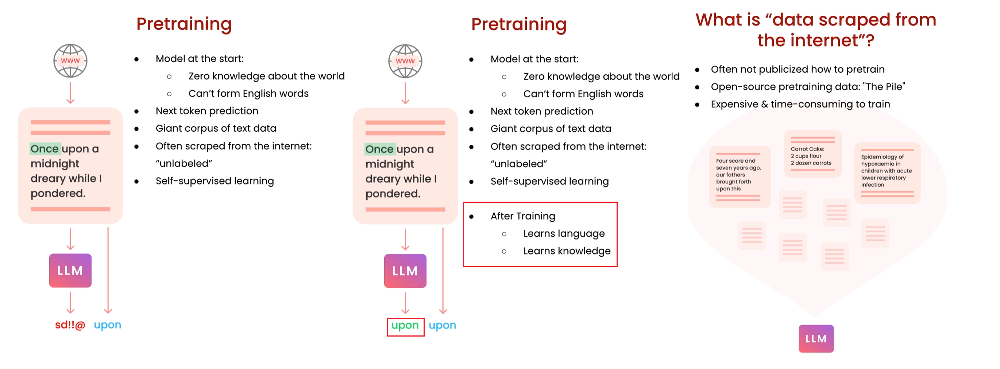

These pretrained model, althoug they are great in their action, they have been trained on some datasets from the internet, and matching data can cause wrong answer and not suitable answer for example for ChatBot, as below.

So we do finetuing with some data, but not as much that data. and still we do the finetuning afterwards. we can use teh same data used for pretraining, or create some data by scraping from different souces as **unlabeled data**, or create a more structured data **labeled**.

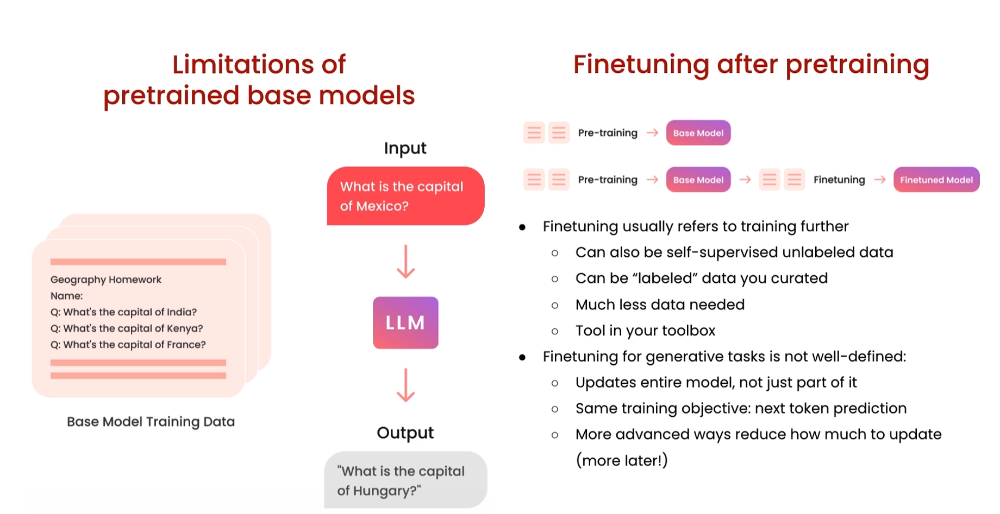

After finetuning, there will be a huge change in the model behavior. also it can have more knowledge, more updated or more correct data.

taking all down:
tasks of fietuing is just ** text in , text out**.

For the first time finetuming: below steps are recommended. First play with a LLM like ChatGPT to find tasks that are ok but not doing best and also not horrible. so only pick one task that can be better. pair some inout and output, which the golden number is ~ 1000 to start. Make sure these inputs and outputs are better than Ok result.

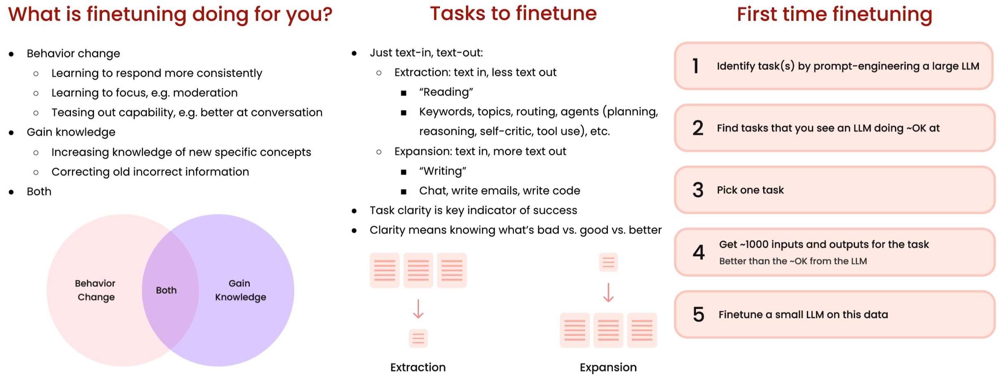

# Lab 2: Where finetuning fits in

In [4]:
!pip install datasets

In [19]:
import jsonlines
import itertools
import pandas as pd
from pprint import pprint

import datasets
from datasets import load_dataset

### Look at pretraining data set
**Sorry**, "The Pile" dataset is currently relocating to a new home and so we can't show you the same example that is in the video. Here is another dataset, the ["Common Crawl"](https://huggingface.co/datasets/c4) dataset.

In [20]:
dataset_list = datasets.list_datasets()
len(dataset_list)

<ipython-input-20-84b19b9166e9>:1: FutureWarning: list_datasets is deprecated and will be removed in the next major version of datasets. Use 'huggingface_hub.list_datasets' instead.
  dataset_list = datasets.list_datasets()


60736

In [21]:
[index for index, value in enumerate(dataset_list) if value == "c4"], dataset_list[71]

([71], 'c4')

In [22]:
#pretrained_dataset = load_dataset("EleutherAI/pile", split="train", streaming=True)

pretrained_dataset = load_dataset("c4", "en", split="train", streaming=True)
# streaming=True: useful when dealing with massive datasets that cannot fit entirely into memory. With streaming, the dataset is read and processed in smaller chunks, which helps manage memory usage.

In [23]:
pretrained_dataset.features

{'text': Value(dtype='string', id=None),
 'timestamp': Value(dtype='string', id=None),
 'url': Value(dtype='string', id=None)}

In [24]:
pretrained_dataset.column_names, pretrained_dataset.description, pretrained_dataset.dataset_size

(['text', 'timestamp', 'url'],
 'A colossal, cleaned version of Common Crawl\'s web crawl corpus.\n\nBased on Common Crawl dataset: "https://commoncrawl.org".\n\nThis is the processed version of Google\'s C4 dataset by AllenAI.\n',
 1657178361414)

In [25]:
# To look at the first 5
n = 5
print("Pretrained dataset:")
top_n = itertools.islice(pretrained_dataset, n)
for i in top_n:
  print(i)

Pretrained dataset:
{'text': 'Beginners BBQ Class Taking Place in Missoula!\nDo you want to get better at making delicious BBQ? You will have the opportunity, put this on your calendar now. Thursday, September 22nd join World Class BBQ Champion, Tony Balay from Lonestar Smoke Rangers. He will be teaching a beginner level class for everyone who wants to get better with their culinary skills.\nHe will teach you everything you need to know to compete in a KCBS BBQ competition, including techniques, recipes, timelines, meat selection and trimming, plus smoker and fire information.\nThe cost to be in the class is $35 per person, and for spectators it is free. Included in the cost will be either a t-shirt or apron and you will be tasting samples of each meat that is prepared.', 'timestamp': '2019-04-25T12:57:54Z', 'url': 'https://klyq.com/beginners-bbq-class-taking-place-in-missoula/'}
{'text': 'Discussion in \'Mac OS X Lion (10.7)\' started by axboi87, Jan 20, 2012.\nI\'ve got a 500gb inter

### Contrast with company finetuning dataset you will be using

Now we get acompany of dataset of a question-answer pairs, called lamini_docs. Here is much more structured. The simplest appraoch is to simply cpncat them together.

In [26]:
import os
os.getcwd()
os.listdir()

['.config', 'sample_data']

In [27]:
!wget -q -O "lamini_docs.jsonl" "https://drive.google.com/uc?export=download&id=1rJDDI2wvEL4npvtOUaJ_-1zuCjBgSxHw"

llm.load_data_from_jsonlines("lamini_docs.jsonl", verbose=True)

In [28]:
filename = "lamini_docs.jsonl"
instruction_dataset_df = pd.read_json(filename, lines=True)
instruction_dataset_df

,input-question,output-answer
0,What are the different types of documents avai...,"Lamini has documentation on Getting Started, A..."
1,What is the recommended way to set up and conf...,Lamini can be downloaded as a python package a...
2,How can I find the specific documentation I ne...,"You can ask this model about documentation, wh..."
3,Does the documentation include explanations of...,Our documentation provides both real-world and...
4,Does the documentation provide information abo...,External dependencies and libraries are all av...
...,...,...
1395,What is Lamini and what is its collaboration w...,Lamini is a library that simplifies the proces...
1396,How does Lamini simplify the process of access...,Lamini simplifies data access in Databricks by...
1397,What are some of the key features provided by ...,Lamini automatically manages the infrastructur...
1398,How does Lamini ensure data privacy during the...,"During the training process, Lamini ensures da..."


In [29]:
instruction_dataset_df.size

2800

So the used data for pretraining is very very large, but for fine tuning only 1400 quation-answer pairs would be enough.

### Various ways of formatting your data

In [30]:
examples = instruction_dataset_df.to_dict()
text = examples["input-question"][0] + examples["output-answer"][0]
text

"What are the different types of documents available in the repository (e.g., installation guide, API documentation, developer's guide)?Lamini has documentation on Getting Started, Authentication, Question Answer Model, Python Library, Batching, Error Handling, Advanced topics, and class documentation on LLM Engine available at https://lamini-ai.github.io/."

In [31]:
examples.keys()

dict_keys(['input-question', 'output-answer'])

In [32]:
if "input-question" in examples and "output-answer" in examples:
  text = examples["input-question"][0] + examples["output-answer"][0]
elif "instruction" in examples and "response" in examples:
  text = examples["instruction"][0] + examples["response"][0]
elif "input" in examples and "output" in examples:
  text = examples["input"][0] + examples["output"][0]
else:
  text = examples["text"][0]

In [33]:
text

"What are the different types of documents available in the repository (e.g., installation guide, API documentation, developer's guide)?Lamini has documentation on Getting Started, Authentication, Question Answer Model, Python Library, Batching, Error Handling, Advanced topics, and class documentation on LLM Engine available at https://lamini-ai.github.io/."

Concatenating is very simple, but sometimes is not enought. so we need more instructued input data, with a question-answer template.

In [34]:
prompt_template_qa = """### Question:
{question}

### Answer:
{answer}"""

In [35]:
question = examples["input-question"][0]
answer = examples["output-answer"][0]

text_with_prompt_template = prompt_template_qa.format(question=question, answer=answer)
text_with_prompt_template

"### Question:\nWhat are the different types of documents available in the repository (e.g., installation guide, API documentation, developer's guide)?\n\n### Answer:\nLamini has documentation on Getting Started, Authentication, Question Answer Model, Python Library, Batching, Error Handling, Advanced topics, and class documentation on LLM Engine available at https://lamini-ai.github.io/."

Often it need to put input and output separate. for example for ecaluate the process to train and test.

In [36]:
prompt_template_q = """### Question:
{question}

### Answer:"""

In [37]:
num_examples = len(examples["input-question"])
finetuning_dataset_text_only = []
finetuning_dataset_question_answer = []
for i in range(num_examples):
  questiaon = examples["input-question"][i]
  answer = examples["output-answer"][i]

  text_with_prompt_template_qa = prompt_template_qa.format(question=question, answer=answer)
  finetuning_dataset_text_only.append({"text": text_with_prompt_template_qa})

  text_with_prompt_template_q = prompt_template_q.format(question=question)
  finetuning_dataset_question_answer.append({"question": text_with_prompt_template_q, "answer": answer})

Now take a look at text only and question-answer format:

In [38]:
pprint(finetuning_dataset_text_only[0])

{'text': '### Question:\n'
         'What are the different types of documents available in the '
         "repository (e.g., installation guide, API documentation, developer's "
         'guide)?\n'
         '\n'
         '### Answer:\n'
         'Lamini has documentation on Getting Started, Authentication, '
         'Question Answer Model, Python Library, Batching, Error Handling, '
         'Advanced topics, and class documentation on LLM Engine available at '
         'https://lamini-ai.github.io/.'}


In [39]:
pprint(finetuning_dataset_question_answer[0])

{'answer': 'Lamini has documentation on Getting Started, Authentication, '
           'Question Answer Model, Python Library, Batching, Error Handling, '
           'Advanced topics, and class documentation on LLM Engine available '
           'at https://lamini-ai.github.io/.',
 'question': '### Question:\n'
             'What are the different types of documents available in the '
             'repository (e.g., installation guide, API documentation, '
             "developer's guide)?\n"
             '\n'
             '### Answer:'}


### Common ways of storing your data
The most common way to store the data is as **jsonl** file. That basically each line there is a json object.

In [40]:
with jsonlines.open(f'lamini_docs_processed.jsonl', 'w') as writer:
    writer.write_all(finetuning_dataset_question_answer)

In [41]:
finetuning_dataset_name = "lamini/lamini_docs"
finetuning_dataset = load_dataset(finetuning_dataset_name)
print(finetuning_dataset)

Extracting data files:   0%|          | 0/2 [00:00<?, ?it/s]

Generating train split:   0%|          | 0/1260 [00:00<?, ? examples/s]

Generating test split:   0%|          | 0/140 [00:00<?, ? examples/s]

DatasetDict({
    train: Dataset({
        features: ['question', 'answer', 'input_ids', 'attention_mask', 'labels'],
        num_rows: 1260
    })
    test: Dataset({
        features: ['question', 'answer', 'input_ids', 'attention_mask', 'labels'],
        num_rows: 140
    })
})


------------------------------------------------------
# Instruction fietuning?
Here we learn about instruction fine tuning. A variant of fine-tuning that enable GPT3 to turn into ChatGPT and giving it the chatting power. Now we want to give this chatting power to all of our model.

## What is instruction fietuning?
It teaches the models to:
- follow the instruction.
- behave like a chatbot
- be a better user interface
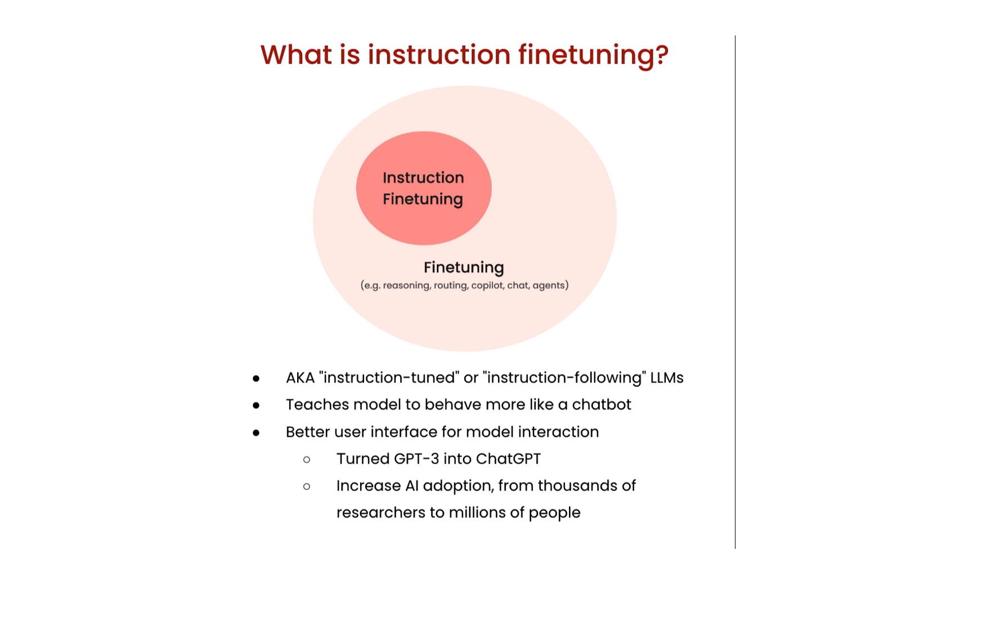

## Instruction-following datasets

As could be find from below, for the datasets as for the instruction finetunig, many are available online or in our own company can be any dialouge as question-answering datasets.

**But what if we do not have any data ?** no problem, we could **convert** our data into some question-answer format or instruction following format, by using a prompt template. We can also use another LLM to do this for us. There is a technique called **Alpaca** from stanford that they use ChatGPT to do this. Also we can use any other opensource model to do this.

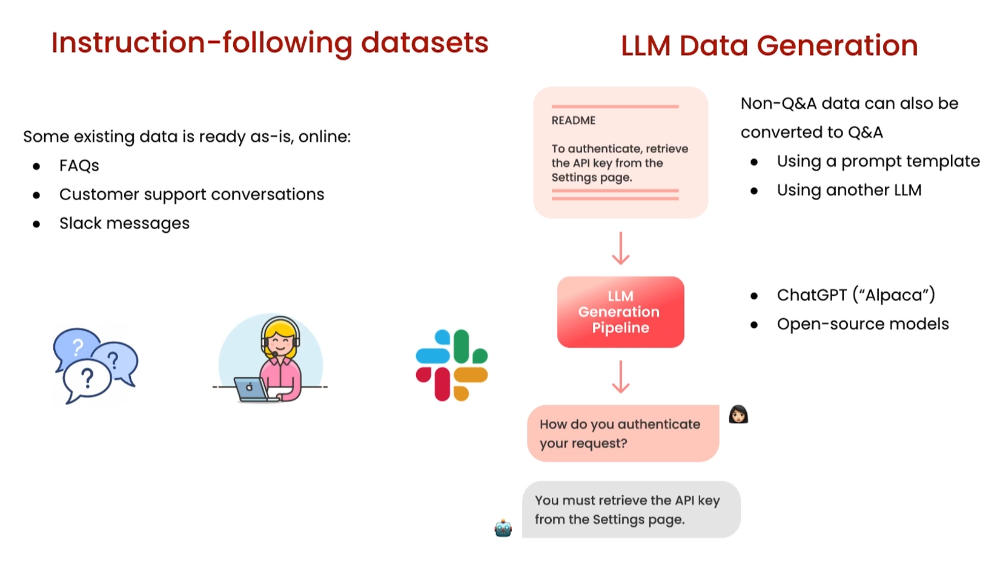

one of the cool thing about finetuning is that it **teaches new behavior ** to the model. Mans, while we have finetuned our model on some data like, Q: what is the capital of french? A: paris, because they are eacy Q-A pairs we can find, we can also generalise this idea of question-answering to ** data we might not have given ** as our finetunig dataset, but that the model have already learned in pretraining step from some papers already pretrained on, but not existed in Q/A instruction format.

As could be fine from below, finetuning is an iterative process and Data prep is really important specially for instruction finetuning.

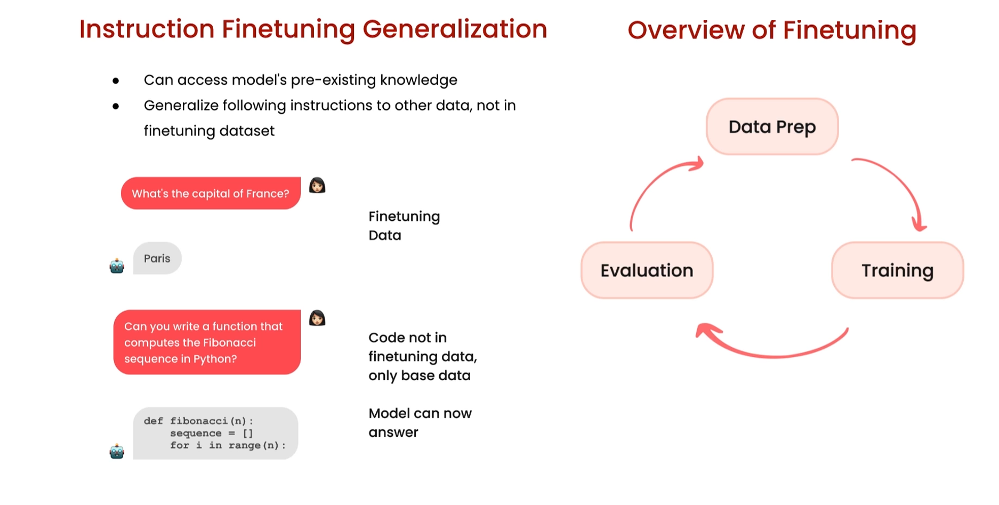

## Lab 3 : Instruction tuning

In [5]:
!pip install transformers

In [43]:
import itertools
import jsonlines

from datasets import load_dataset
from pprint import pprint

from llama import BasicModelRunner
from transformers import AutoTokenizer, AutoModelForCausalLM
from transformers import AutoModelForSeq2SeqLM, AutoTokenizer

### Load instruction tuned dataset

In [44]:
[index for index, value in enumerate(dataset_list) if value == "tatsu-lab/alpaca"], dataset_list[24081]

([24082], 'oscar-corpus/oscar-2301-hpc')

In [45]:
instruction_tuned_dataset = load_dataset("tatsu-lab/alpaca", split="train", streaming=True)

In [46]:
instruction_tuned_dataset.column_names

['instruction', 'input', 'output', 'text']

In [47]:
instruction_tuned_dataset.info

DatasetInfo(description='', citation='', homepage='', license='', features={'instruction': Value(dtype='string', id=None), 'input': Value(dtype='string', id=None), 'output': Value(dtype='string', id=None), 'text': Value(dtype='string', id=None)}, post_processed=None, supervised_keys=None, task_templates=None, builder_name='parquet', dataset_name='alpaca', config_name='default', version=0.0.0, splits=None, download_checksums=None, download_size=None, post_processing_size=None, dataset_size=None, size_in_bytes=None)

In [48]:
m = 5
print("Instruction-tuned dataset:")
top_m = list(itertools.islice(instruction_tuned_dataset, m))
for j in top_m:
  print(j)

Instruction-tuned dataset:
{'instruction': 'Give three tips for staying healthy.', 'input': '', 'output': '1.Eat a balanced diet and make sure to include plenty of fruits and vegetables. \n2. Exercise regularly to keep your body active and strong. \n3. Get enough sleep and maintain a consistent sleep schedule.', 'text': 'Below is an instruction that describes a task. Write a response that appropriately completes the request.\n\n### Instruction:\nGive three tips for staying healthy.\n\n### Response:\n1.Eat a balanced diet and make sure to include plenty of fruits and vegetables. \n2. Exercise regularly to keep your body active and strong. \n3. Get enough sleep and maintain a consistent sleep schedule.'}
{'instruction': 'What are the three primary colors?', 'input': '', 'output': 'The three primary colors are red, blue, and yellow.', 'text': 'Below is an instruction that describes a task. Write a response that appropriately completes the request.\n\n### Instruction:\nWhat are the three p

### Two prompt templates

We have used two templates for prompting among which one is irelevent to input.

In [49]:
prompt_template_with_input = """Below is an instruction that describes a task, paired with an input that provides further context. Write a response that appropriately completes the request.

### Instruction:
{instruction}

### Input:
{input}

### Response:"""

prompt_template_without_input = """Below is an instruction that describes a task. Write a response that appropriately completes the request.

### Instruction:
{instruction}

### Response:"""

### Hydrate prompts (add data to prompts)

In [50]:
processed_data = []
for j in top_m:
  if not j["input"]:
    processed_prompt = prompt_template_without_input.format(instruction=j["instruction"])
  else:
    processed_prompt = prompt_template_with_input.format(instruction=j["instruction"], input=j["input"])

  processed_data.append({"input": processed_prompt, "output": j["output"]})


In [51]:
pprint(processed_data[0])

{'input': 'Below is an instruction that describes a task. Write a response '
          'that appropriately completes the request.\n'
          '\n'
          '### Instruction:\n'
          'Give three tips for staying healthy.\n'
          '\n'
          '### Response:',
 'output': '1.Eat a balanced diet and make sure to include plenty of fruits '
           'and vegetables. \n'
           '2. Exercise regularly to keep your body active and strong. \n'
           '3. Get enough sleep and maintain a consistent sleep schedule.'}


### Save data to jsonl
Then we write it to ajsonl format and we can also upload it in hugungface for future usecases.

In [52]:
with jsonlines.open(f'alpaca_processed.jsonl', 'w') as writer:
    writer.write_all(processed_data)

### Compare non-instruction-tuned vs. instruction-tuned models

The uploaded dataset

In [53]:
dataset_path_hf = "lamini/alpaca"
dataset_hf = load_dataset(dataset_path_hf)
print(dataset_hf)

Extracting data files:   0%|          | 0/1 [00:00<?, ?it/s]

Generating train split:   0%|          | 0/52002 [00:00<?, ? examples/s]

DatasetDict({
    train: Dataset({
        features: ['input', 'output'],
        num_rows: 52002
    })
})


In [54]:
dataset_hf.column_names

{'train': ['input', 'output']}

In [55]:
dataset_hf["train"]

Dataset({
    features: ['input', 'output'],
    num_rows: 52002
})

In [56]:
dataset_hf["train"]['input'][0], '\n', dataset_hf["train"]['output'][0]

('Below is an instruction that describes a task. Write a response that appropriately completes the request.\n\n### Instruction:\nGive three tips for staying healthy.\n\n### Response:',
 '\n',
 '1.Eat a balanced diet and make sure to include plenty of fruits and vegetables. \n2. Exercise regularly to keep your body active and strong. \n3. Get enough sleep and maintain a consistent sleep schedule.')

In [57]:
non_instruct_model = BasicModelRunner("meta-llama/Llama-2-7b-hf")
non_instruct_output = non_instruct_model("Tell me how to train my dog to sit")
print("Not instruction-tuned output (Llama 2 Base):", non_instruct_output)

Not instruction-tuned output (Llama 2 Base): .
Tell me how to train my dog to sit. I have a 10 month old puppy and I want to train him to sit. I have tried the treat method and he just sits there and looks at me like I am crazy. I have tried the "sit" command and he just looks at me like I am crazy. I have tried the "sit" command and he just looks at me like I am crazy. I have tried the "sit" command and he just looks at me like I am crazy. I have tried the "sit" command and he just looks at me like I am crazy. I have tried the "sit" command and he just looks at me like I am crazy. I have tried the "sit" command and he just looks at me like I am crazy. I have tried the "sit" command and he just looks at me like I am crazy. I have tried the "sit" command and he just looks at me like I am crazy. I have tried the "sit" command and he just looks at me like I am crazy. I have tried the "sit" command and he just looks


In [58]:
instruct_model = BasicModelRunner("meta-llama/Llama-2-7b-chat-hf")
instruct_output = instruct_model("Tell me how to train my dog to sit")
print("Instruction-tuned output (Llama 2): ", instruct_output)

Instruction-tuned output (Llama 2):  on command.
How to Train Your Dog to Sit on Command
Training your dog to sit on command is a basic obedience command that can be achieved with patience, consistency, and positive reinforcement. Here's a step-by-step guide on how to train your dog to sit on command:
1. Choose a Quiet and Distraction-Free Area: Find a quiet area with minimal distractions where your dog can focus on you.
2. Have Treats Ready: Choose your dog's favorite treats and have them ready to use as rewards.
3. Stand in Front of Your Dog: Stand in front of your dog and hold a treat close to their nose.
4. Move the Treat Above Your Dog's Head: Slowly move the treat above your dog's head, towards their tail. As your dog follows the treat with their nose, their bottom will naturally lower into a sitting position.
5. Say "Sit" and Reward: As soon as your dog's butt touches the ground, say "Sit" and give them the treat. It's important to say the command word as they're performing


In [59]:
chatgpt = BasicModelRunner("chat-gpt")
instruct_output_chatgpt = chatgpt("Tell me how to train my dog to sit")
print("Instruction-tuned output (ChatGPT): ", instruct_output_chatgpt)

Instruction-tuned output (ChatGPT):  Training a dog to sit is a basic command that can be taught using positive reinforcement techniques. Here's a step-by-step guide on how to train your dog to sit:

1. Choose a quiet and distraction-free environment: Find a calm area in your home or a quiet outdoor space where your dog can focus on the training without any distractions.

2. Gather treats: Use small, soft, and tasty treats that your dog loves. These treats will serve as rewards during the training process.

3. Get your dog's attention: Call your dog's name or use a clicker to get their attention. Make sure they are looking at you before proceeding.

4. Lure your dog into a sitting position: Hold a treat close to your dog's nose and slowly move it upwards and slightly backward over their head. As their nose follows the treat, their bottom will naturally lower into a sitting position. Once they are sitting, say "sit" in a clear and firm voice.

5. Reward and praise: As soon as your dog s

ChatGPT has 175 billion parameters and is really large model. now we try a much smaller od like two below with 70m number.

### Try smaller models
We call a small, pretrained model and its relevant tokenizer.

In [29]:
tokenizer = AutoTokenizer.from_pretrained("EleutherAI/pythia-70m")
model = AutoModelForCausalLM.from_pretrained("EleutherAI/pythia-70m")

** Example:**
Let's say you want to generate text using this model. Here's a simple example of how you might use the tokenizer and model

In [61]:
# Text to be used as a prompt
prompt = "Once upon a time, in a faraway land, there was a"

# Tokenize the prompt
input_ids = tokenizer.encode(prompt, return_tensors="pt") # pt: returns pytorch tensor. also can use np to return numpy array
input_ids

tensor([[10758,  2220,   247,   673,    13,   275,   247,  2080, 12594,  2659,
            13,   627,   369,   247]])

Here's a breakdown of what each number in the input_ids tensor corresponds to in the tokenized form of the text prompt:

- 10758: Token for "Once"
- 2220: Token for "upon"
- 247: Token for ","
- 673: Token for "a"
- 13: Token for " "
- 275: Token for "time"
- 247: Token for ","
- 2080: Token for "in"
- 12594: Token for "a"
- 2659: Token for "faraway"
- 13: Token for " "
- 627: Token for "land"
- 369: Token for ","
- 247: Token for "a"
Please note that these tokens correspond to subwords or characters, as the tokenizer used is based on Byte Pair Encoding (BPE), which can break words into smaller units for tokenization. The [CLS] and [SEP] tokens are not explicitly shown in this tensor but are also part of the tokenized sequence.

In [62]:
# Generate text based on the prompt
output = model.generate(input_ids, max_length=50, num_return_sequences=1, no_repeat_ngram_size=2)

# Decode the generated tokens back into text
generated_text = tokenizer.decode(output[0], skip_special_tokens=True)

print("Generated Text:")
print(generated_text)


The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Generated Text:
Once upon a time, in a faraway land, there was a great deal of land in the area, and the land was not a place to live.

The land is a land of the people, not just the inhabitants of it,


In [63]:
output, input_ids

(tensor([[10758,  2220,   247,   673,    13,   275,   247,  2080, 12594,  2659,
             13,   627,   369,   247,  1270,  2968,   273,  2659,   275,   253,
           2170,    13,   285,   253,  2659,   369,   417,   247,  1659,   281,
           3153,    15,   187,   187,   510,  2659,   310,   247,  2659,   273,
            253,   952,    13,   417,   816,   253, 21251,   273,   352,    13]]),
 tensor([[10758,  2220,   247,   673,    13,   275,   247,  2080, 12594,  2659,
             13,   627,   369,   247]]))

1. text -> tokenizer.encode -> input_ids
2. input_ids -> mode -> output = input_ids + new_created_ids
3. output -> tokenizer.decode -> generated_text = text + added_text

**So the added text would be : generated_text[0][len(text):]**

generated_text -> is a one item list, thats why we have [0]

Attention Mask: In neural language models like GPT-3, the attention mask is used to indicate which tokens in the input sequence the model should pay attention to and which tokens should be ignored. It's a binary mask where 1s indicate tokens that should be attended to, and 0s indicate tokens that should be ignored.

Pad Token ID: The pad token ID is used to specify which token in the model's vocabulary represents padding. When generating text, it's essential to know how to handle padding tokens correctly.

In [64]:
def inference(text, model, tokenizer, max_input_tokens=1000, max_output_tokens=100):
  # Tokenize
  input_ids = tokenizer.encode(
          text,
          return_tensors="pt",
          truncation=True,
          max_length=max_input_tokens
  )

  # Generate
  device = model.device
  generated_tokens_with_prompt = model.generate(
    input_ids=input_ids.to(device),
    max_length=max_output_tokens
  )

  # Decode
  generated_text_with_prompt = tokenizer.batch_decode(generated_tokens_with_prompt, skip_special_tokens=True)

  # Strip the prompt
  generated_text_answer = generated_text_with_prompt[0][len(text):]

  return generated_text_answer

In [65]:
finetuning_dataset_path = "lamini/lamini_docs"
finetuning_dataset = load_dataset(finetuning_dataset_path)
pprint(finetuning_dataset)

DatasetDict({
    train: Dataset({
        features: ['question', 'answer', 'input_ids', 'attention_mask', 'labels'],
        num_rows: 1260
    })
    test: Dataset({
        features: ['question', 'answer', 'input_ids', 'attention_mask', 'labels'],
        num_rows: 140
    })
})


In [66]:
test_sample = finetuning_dataset["test"][0]
print(test_sample)
print("test_sample['question']:", test_sample["question"])

print(inference(test_sample["question"], model, tokenizer))

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


{'question': 'Can Lamini generate technical documentation or user manuals for software projects?', 'answer': 'Yes, Lamini can generate technical documentation and user manuals for software projects. It uses natural language generation techniques to create clear and concise documentation that is easy to understand for both technical and non-technical users. This can save developers a significant amount of time and effort in creating documentation, allowing them to focus on other aspects of their projects.', 'input_ids': [5804, 418, 4988, 74, 6635, 7681, 10097, 390, 2608, 11595, 84, 323, 3694, 6493, 32, 4374, 13, 418, 4988, 74, 476, 6635, 7681, 10097, 285, 2608, 11595, 84, 323, 3694, 6493, 15, 733, 4648, 3626, 3448, 5978, 5609, 281, 2794, 2590, 285, 44003, 10097, 326, 310, 3477, 281, 2096, 323, 1097, 7681, 285, 1327, 14, 48746, 4212, 15, 831, 476, 5321, 12259, 247, 1534, 2408, 273, 673, 285, 3434, 275, 6153, 10097, 13, 6941, 731, 281, 2770, 327, 643, 7794, 273, 616, 6493, 15], 'attention

So the generated text is not even close to the actual answer.

### Compare to finetuned small model

The previous example was created by the pretrained model that has not yet fine tuned. Now we do the same via fine_tuned text.

In [67]:
instruction_model = AutoModelForCausalLM.from_pretrained("lamini/lamini_docs_finetuned")

In [68]:
# We run the same question as above here. It seems far more accurate.
print(inference(test_sample["question"], instruction_model, tokenizer))

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Yes, Lamini can generate technical documentation or user manuals for software projects. This can be achieved by providing a prompt for a specific technical question or question to the LLM Engine, or by providing a prompt for a specific technical question or question. Additionally, Lamini can be trained on specific technical questions or questions to help users understand the process and provide feedback to the LLM Engine. Additionally, Lamini


In [69]:
# Pssst! If you were curious how to upload your own dataset to Huggingface
# Here is how we did it

# !pip install huggingface_hub
# !huggingface-cli login

# import pandas as pd
# import datasets
# from datasets import Dataset

# finetuning_dataset = Dataset.from_pandas(pd.DataFrame(data=finetuning_dataset))
# finetuning_dataset.push_to_hub(dataset_path_hf)

----------------------------------------------------------------------------
# Data preparation
After exploring the data, now we learn how to prepare the data for trining.
- If train on garbage data, it will create garbage output.
- Having diverse data, covers alot of aspects of usecases is helpful. If the all are the same model will memorize it instead of learning them.
- There are lots of ways to generate data, like using LLMs, but having real data is very helpful. because generated data has already a certain pattern in it. So using real data will help to learn more patterns.
- having More data is also imortant, but not as good as the last three items, because already model is pretrained on large amount of data.

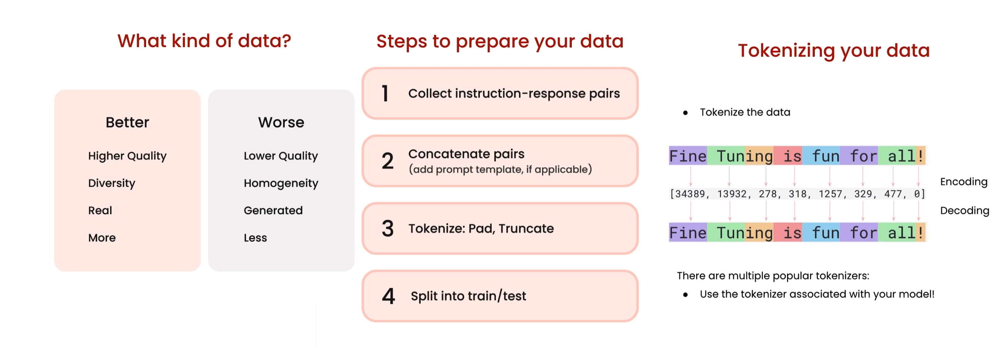

## Lab 4 : Data preparation

In [70]:
tokenizer.encode("Fine Tuning is fun for all!", return_tensors="pt")

tensor([[28986,   308, 25004,   310,   794,   323,   512,     2]])

In [71]:
tokenizer.decode(tokenizer.encode("Fine Tuning is fun for all!", return_tensors="pt")[0], skip_special_tokens=True)

'Fine Tuning is fun for all!'

In [72]:
# !pip install transformers

In [73]:
import pandas as pd
import datasets

from pprint import pprint
from transformers import AutoTokenizer # Hugging Face Transformers AutoTokenizer:

### Tokenizing text
 Hugging Face Transformers library tokenizers are specifically designed for use with transformer-based models like BERT, GPT-2, etc. They tokenize text into subword units (subword tokenization) and provide various model-specific features like padding, truncation, etc.

In [74]:
tokenizer = AutoTokenizer.from_pretrained("EleutherAI/pythia-70m")

In [75]:
text = "Hi, how are you?"

In [76]:
tokenizer(text)

{'input_ids': [12764, 13, 849, 403, 368, 32], 'attention_mask': [1, 1, 1, 1, 1, 1]}

In [77]:
encoded_text = tokenizer(text)["input_ids"]
encoded_text

[12764, 13, 849, 403, 368, 32]

In [78]:
tokenizer.encode(text)

[12764, 13, 849, 403, 368, 32]

In [79]:
encoded_text

[12764, 13, 849, 403, 368, 32]

In [80]:
tokenizer("hi are Hi")

{'input_ids': [5801, 403, 17459], 'attention_mask': [1, 1, 1]}

In [81]:
tokenizer.encode("Hi, how are you?"), tokenizer.decode(tokenizer.encode("Hi, how are you?"))

([12764, 13, 849, 403, 368, 32], 'Hi, how are you?')

In [82]:
decoded_text = tokenizer.decode(encoded_text)
print("Decoded tokens back into text: ", decoded_text)

Decoded tokens back into text:  Hi, how are you?


### Tokenize multiple texts at once

In [83]:
list_texts = ["Hi, how are you?", "I'm good", "Yes"]
encoded_texts = tokenizer(list_texts)
print("Encoded several texts: ", encoded_texts["input_ids"])

Encoded several texts:  [[12764, 13, 849, 403, 368, 32], [42, 1353, 1175], [4374]]


### Padding and truncation
Everything in the batch is the same lenght, because we are operating with the same size tensors. So texts need to be the same. We use "padding" strategy to handle this various lenght text. we use 0 at the end of the sentences.

In [84]:
tokenizer.pad_token = tokenizer.eos_token
encoded_texts_longest = tokenizer(list_texts, padding=True)
print("Using padding: ", encoded_texts_longest["input_ids"])

Using padding:  [[12764, 13, 849, 403, 368, 32], [42, 1353, 1175, 0, 0, 0], [4374, 0, 0, 0, 0, 0]]


In [85]:
encoded_texts_truncation = tokenizer(list_texts, max_length=3, truncation=True)
print("Using truncation: ", encoded_texts_truncation["input_ids"])

Using truncation:  [[12764, 13, 849], [42, 1353, 1175], [4374]]


we can also truncate from the other side:

In [86]:
tokenizer.truncation_side = "left"
encoded_texts_truncation_left = tokenizer(list_texts, max_length=3, truncation=True)
print("Using left-side truncation: ", encoded_texts_truncation_left["input_ids"])

Using left-side truncation:  [[403, 368, 32], [42, 1353, 1175], [4374]]


To do both truncation and pading:


In [87]:
encoded_texts_both = tokenizer(list_texts, max_length=3, truncation=True, padding=True)
print("Using both padding and truncation: ", encoded_texts_both["input_ids"])

Using both padding and truncation:  [[403, 368, 32], [42, 1353, 1175], [4374, 0, 0]]


### Prepare instruction dataset

In [88]:
examples.keys()

dict_keys(['input-question', 'output-answer'])

In [89]:
import pandas as pd

filename = "lamini_docs.jsonl"
instruction_dataset_df = pd.read_json(filename, lines=True)
examples = instruction_dataset_df.to_dict()

if "input-question" in examples and "output-answer" in examples:
  text = examples["input-question"][0] + examples["output-answer"][0]
elif "instruction" in examples and "response" in examples:
  text = examples["instruction"][0] + examples["response"][0]
elif "input" in examples and "output" in examples:
  text = examples["input"][0] + examples["output"][0]
else:
  text = examples["text"][0]

prompt_template = """### Question:
{question}

### Answer:"""

num_examples = len(examples["input-question"])
finetuning_dataset = []
for i in range(num_examples):
  question = examples["input-question"][i]
  answer = examples["output-answer"][i]
  text_with_prompt_template = prompt_template.format(question=question)
  finetuning_dataset.append({"question": text_with_prompt_template, "answer": answer})

from pprint import pprint
print("One datapoint in the finetuning dataset:")
pprint(finetuning_dataset[0])

One datapoint in the finetuning dataset:
{'answer': 'Lamini has documentation on Getting Started, Authentication, '
           'Question Answer Model, Python Library, Batching, Error Handling, '
           'Advanced topics, and class documentation on LLM Engine available '
           'at https://lamini-ai.github.io/.',
 'question': '### Question:\n'
             'What are the different types of documents available in the '
             'repository (e.g., installation guide, API documentation, '
             "developer's guide)?\n"
             '\n'
             '### Answer:'}


### Tokenize a single example

In [90]:
print(tokenizer.encode(text))
print(tokenizer.decode(tokenizer.encode(text)))

[1276, 403, 253, 1027, 3510, 273, 7177, 2130, 275, 253, 18491, 313, 70, 15, 72, 904, 12692, 7102, 13, 8990, 10097, 13, 13722, 434, 7102, 6177, 45, 4988, 74, 556, 10097, 327, 27669, 11075, 264, 13, 5271, 23058, 13, 19782, 37741, 10031, 13, 13814, 11397, 13, 378, 16464, 13, 11759, 10535, 1981, 13, 21798, 12989, 13, 285, 966, 10097, 327, 21708, 46, 10797, 2130, 387, 5987, 1358, 77, 4988, 74, 14, 2284, 15, 7280, 15, 900, 14206]
What are the different types of documents available in the repository (e.g., installation guide, API documentation, developer's guide)?Lamini has documentation on Getting Started, Authentication, Question Answer Model, Python Library, Batching, Error Handling, Advanced topics, and class documentation on LLM Engine available at https://lamini-ai.github.io/.


In [91]:
text = finetuning_dataset[0]["question"] + finetuning_dataset[0]["answer"]
print(text)
tokenized_inputs = tokenizer(
    text,
    return_tensors="np",   # to return tensor as a numpy array here.
    padding=True
)
print(tokenized_inputs["input_ids"])

### Question:
What are the different types of documents available in the repository (e.g., installation guide, API documentation, developer's guide)?

### Answer:Lamini has documentation on Getting Started, Authentication, Question Answer Model, Python Library, Batching, Error Handling, Advanced topics, and class documentation on LLM Engine available at https://lamini-ai.github.io/.
[[ 4118 19782    27   187  1276   403   253  1027  3510   273  7177  2130
    275   253 18491   313    70    15    72   904 12692  7102    13  8990
  10097    13 13722   434  7102  6177   187   187  4118 37741    27    45
   4988    74   556 10097   327 27669 11075   264    13  5271 23058    13
  19782 37741 10031    13 13814 11397    13   378 16464    13 11759 10535
   1981    13 21798 12989    13   285   966 10097   327 21708    46 10797
   2130   387  5987  1358    77  4988    74    14  2284    15  7280    15
    900 14206]]


In [92]:
text

"### Question:\nWhat are the different types of documents available in the repository (e.g., installation guide, API documentation, developer's guide)?\n\n### Answer:Lamini has documentation on Getting Started, Authentication, Question Answer Model, Python Library, Batching, Error Handling, Advanced topics, and class documentation on LLM Engine available at https://lamini-ai.github.io/."

In [93]:
max_length = 2048
max_length = min(
    tokenized_inputs["input_ids"].shape[1],
    max_length,
)
max_length

86

In [94]:
# Then we can truncate it to that max lenght

In [95]:
tokenized_inputs = tokenizer(
    text,
    return_tensors="np",
    truncation=True,
    max_length=max_length
)
tokenized_inputs["input_ids"]

array([[ 4118, 19782,    27,   187,  1276,   403,   253,  1027,  3510,
          273,  7177,  2130,   275,   253, 18491,   313,    70,    15,
           72,   904, 12692,  7102,    13,  8990, 10097,    13, 13722,
          434,  7102,  6177,   187,   187,  4118, 37741,    27,    45,
         4988,    74,   556, 10097,   327, 27669, 11075,   264,    13,
         5271, 23058,    13, 19782, 37741, 10031,    13, 13814, 11397,
           13,   378, 16464,    13, 11759, 10535,  1981,    13, 21798,
        12989,    13,   285,   966, 10097,   327, 21708,    46, 10797,
         2130,   387,  5987,  1358,    77,  4988,    74,    14,  2284,
           15,  7280,    15,   900, 14206]])

### Tokenize the instruction dataset
Now we want to run it on the entire dataset.

In [96]:
def tokenize_function(examples):
    if "input-question" in examples and "output-answer" in examples:
      text = examples["input-question"][0] + examples["output-answer"][0]
    elif "input" in examples and "output" in examples:
      text = examples["input"][0] + examples["output"][0]
    else:
      text = examples["text"][0]

    tokenizer.pad_token = tokenizer.eos_token
    tokenized_inputs = tokenizer(
        text,
        return_tensors="np",
        padding=True,
    )

    max_length = min(
        tokenized_inputs["input_ids"].shape[1],
        2048
    )
    tokenizer.truncation_side = "left"
    tokenized_inputs = tokenizer(
        text,
        return_tensors="np",
        truncation=True,
        max_length=max_length
    )

    return tokenized_inputs

Then we just map this function on the entire dataset.

In [97]:
filename

'lamini_docs.jsonl'

In [98]:
finetuning_dataset_loaded = datasets.load_dataset("json", data_files=filename, split="train")

tokenized_dataset = finetuning_dataset_loaded.map(
    tokenize_function,
    batched=True,
    batch_size=1,
    drop_last_batch=True
)

print(tokenized_dataset)

Extracting data files:   0%|          | 0/1 [00:00<?, ?it/s]

Generating train split: 0 examples [00:00, ? examples/s]

Map:   0%|          | 0/1400 [00:00<?, ? examples/s]

Dataset({
    features: ['input-question', 'output-answer', 'input_ids', 'attention_mask'],
    num_rows: 1400
})


In [99]:
print(finetuning_dataset_loaded)
finetuning_dataset_loaded["input-question"][2], finetuning_dataset_loaded["output-answer"][2]

Dataset({
    features: ['input-question', 'output-answer'],
    num_rows: 1400
})


('How can I find the specific documentation I need for a particular feature or function?',
 'You can ask this model about documentation, which is trained on our publicly available docs and source code, or you can go to https://lamini-ai.github.io/.')

In [100]:
print(tokenized_dataset["input-question"][2])
pprint(tokenized_dataset["output-answer"][2])
print(tokenized_dataset["input_ids"][2])

How can I find the specific documentation I need for a particular feature or function?
('You can ask this model about documentation, which is trained on our publicly '
 'available docs and source code, or you can go to '
 'https://lamini-ai.github.io/.')
[2347, 476, 309, 1089, 253, 2173, 10097, 309, 878, 323, 247, 1798, 4735, 390, 1159, 32, 1394, 476, 1642, 436, 1566, 670, 10097, 13, 534, 310, 10166, 327, 776, 13644, 2130, 27586, 285, 2603, 2127, 13, 390, 368, 476, 564, 281, 5987, 1358, 77, 4988, 74, 14, 2284, 15, 7280, 15, 900, 14206]


In [101]:
pprint(tokenizer.decode(tokenized_dataset["input_ids"][2]))

('How can I find the specific documentation I need for a particular feature or '
 'function?You can ask this model about documentation, which is trained on our '
 'publicly available docs and source code, or you can go to '
 'https://lamini-ai.github.io/.')


Then we need to split the dataset. So i have to add a column named "labels"

In [102]:
tokenized_dataset

Dataset({
    features: ['input-question', 'output-answer', 'input_ids', 'attention_mask'],
    num_rows: 1400
})

In [103]:
tokenized_dataset = tokenized_dataset.add_column("labels", tokenized_dataset["input_ids"])
tokenized_dataset

Dataset({
    features: ['input-question', 'output-answer', 'input_ids', 'attention_mask', 'labels'],
    num_rows: 1400
})

In [104]:
print(tokenized_dataset["labels"][0])
print(tokenized_dataset["input_ids"][0])

[1276, 403, 253, 1027, 3510, 273, 7177, 2130, 275, 253, 18491, 313, 70, 15, 72, 904, 12692, 7102, 13, 8990, 10097, 13, 13722, 434, 7102, 6177, 45, 4988, 74, 556, 10097, 327, 27669, 11075, 264, 13, 5271, 23058, 13, 19782, 37741, 10031, 13, 13814, 11397, 13, 378, 16464, 13, 11759, 10535, 1981, 13, 21798, 12989, 13, 285, 966, 10097, 327, 21708, 46, 10797, 2130, 387, 5987, 1358, 77, 4988, 74, 14, 2284, 15, 7280, 15, 900, 14206]
[1276, 403, 253, 1027, 3510, 273, 7177, 2130, 275, 253, 18491, 313, 70, 15, 72, 904, 12692, 7102, 13, 8990, 10097, 13, 13722, 434, 7102, 6177, 45, 4988, 74, 556, 10097, 327, 27669, 11075, 264, 13, 5271, 23058, 13, 19782, 37741, 10031, 13, 13814, 11397, 13, 378, 16464, 13, 11759, 10535, 1981, 13, 21798, 12989, 13, 285, 966, 10097, 327, 21708, 46, 10797, 2130, 387, 5987, 1358, 77, 4988, 74, 14, 2284, 15, 7280, 15, 900, 14206]


In [105]:
type(tokenized_dataset["labels"]) , len(tokenized_dataset["labels"]), len(tokenized_dataset["labels"][0]), tokenized_dataset["input_ids"][0][:3]

(list, 1400, 77, [1276, 403, 253])

In [106]:
type(tokenized_dataset["input_ids"]) , len(tokenized_dataset["input_ids"]), len(tokenized_dataset["input_ids"][0]), tokenized_dataset["input_ids"][0][:3]

(list, 1400, 77, [1276, 403, 253])

### Prepare test/train splits


In [107]:
split_dataset = tokenized_dataset.train_test_split(test_size=0.1, shuffle=True, seed=123)
print(split_dataset)

DatasetDict({
    train: Dataset({
        features: ['input-question', 'output-answer', 'input_ids', 'attention_mask', 'labels'],
        num_rows: 1260
    })
    test: Dataset({
        features: ['input-question', 'output-answer', 'input_ids', 'attention_mask', 'labels'],
        num_rows: 140
    })
})


### Some datasets for you to try
It can be any dataset. below are some sample datasets to work with.

In [108]:
finetuning_dataset_path = "lamini/lamini_docs"
finetuning_dataset = datasets.load_dataset(finetuning_dataset_path)
print(finetuning_dataset)

DatasetDict({
    train: Dataset({
        features: ['question', 'answer', 'input_ids', 'attention_mask', 'labels'],
        num_rows: 1260
    })
    test: Dataset({
        features: ['question', 'answer', 'input_ids', 'attention_mask', 'labels'],
        num_rows: 140
    })
})


In [109]:
taylor_swift_dataset = "lamini/taylor_swift"   # taylor_swift dataset
bts_dataset = "lamini/bts"                     # bts band dataset
open_llms = "lamini/open_llms"                 # open source llm

In [110]:
dataset_swiftie = datasets.load_dataset(taylor_swift_dataset)
print(dataset_swiftie["train"][1])

Extracting data files:   0%|          | 0/2 [00:00<?, ?it/s]

Generating train split:   0%|          | 0/783 [00:00<?, ? examples/s]

Generating test split:   0%|          | 0/87 [00:00<?, ? examples/s]

{'question': 'What is the most popular Taylor Swift song among millennials? How does this song relate to the millennial generation? What is the significance of this song in the millennial culture?', 'answer': 'Taylor Swift\'s "Shake It Off" is the most popular song among millennials. This song relates to the millennial generation as it is an anthem of self-acceptance and embracing one\'s individuality. The song\'s message of not letting others bring you down and to just dance it off resonates with the millennial culture, which is often characterized by a strong sense of individuality and a rejection of societal norms. Additionally, the song\'s upbeat and catchy melody makes it a perfect fit for the millennial generation, which is known for its love of pop music.', 'input_ids': [1276, 310, 253, 954, 4633, 11276, 24619, 4498, 2190, 24933, 8075, 32, 1359, 1057, 436, 4498, 14588, 281, 253, 24933, 451, 5978, 32, 1737, 310, 253, 8453, 273, 436, 4498, 275, 253, 24933, 451, 4466, 32, 37979, 24

In [111]:
dataset_swiftie.column_names, dataset_swiftie.shape

({'train': ['question', 'answer', 'input_ids', 'attention_mask', 'labels'],
  'test': ['question', 'answer', 'input_ids', 'attention_mask', 'labels']},
 {'train': (783, 5), 'test': (87, 5)})

In [112]:
pprint(dataset_swiftie["train"]["question"][:3])

["What is the controversy surrounding Taylor Swift's music and how has it "
 'impacted her career?',
 'What is the most popular Taylor Swift song among millennials? How does this '
 'song relate to the millennial generation? What is the significance of this '
 'song in the millennial culture?',
 "What is the significance of the album Red in Taylor Swift's career? How did "
 'it impact her music and her image as a pop star?']


In [113]:
# This is how to push your own dataset to your Huggingface hub
# !pip install huggingface_hub
# !huggingface-cli login
# split_dataset.push_to_hub(dataset_path_hf)

----------------------------------------------------------------------------
# Training processes

At this part we step through training the model and at the end see the model improved in task, specifically here to be able to chat with it.

Here the training process is look like other NN.

First we go for a number of epochs, and epoch is a path through the entire of our dataset, we will go to entire of our dataset for multiple times. Then wwe want to load it up into batches, that are sets of data into together. Then we put the bacth through our model to get the output. Then find the loss and optimise it.

It is a low level code in pytorch, we will go actually one level higher in hugingface and also another level higher into Lama library, in lamini, just to see how the training process actually works.


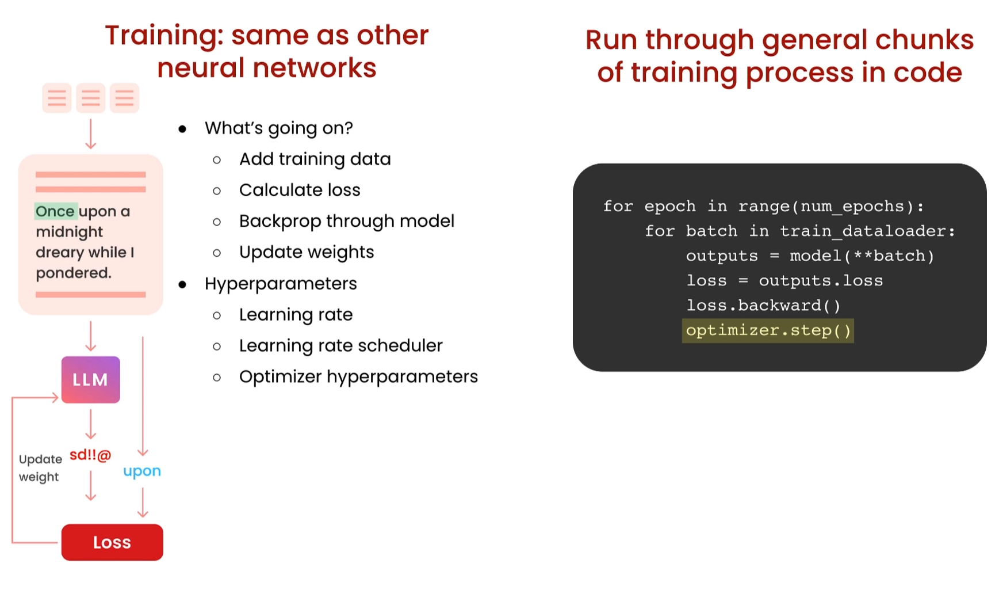

## Lab 5: Training

### Technically, it's only a few lines of code to run on GPUs (elsewhere, ie. on Lamini).
```
from llama import BasicModelRunner

model = BasicModelRunner("EleutherAI/pythia-410m")
# a language model created by EleutherAI with approximately 410 million parameters
model.load_data_from_jsonlines("lamini_docs.jsonl")
model.train()
```
1. Choose base model.
2. Load data.
3. Train it. Returns a model ID, dashboard, and playground interface.

#### Let's look under the hood at the core code running this! This is the open core of Lamini's `llama` library :)

Here we use pretty smal model, because it can run nicely on CPU. so we can actually see how the process go. But for actual usecase, it is better to use a model a bit larger, with around billion parameters.

In [114]:
# !pip install config
# !pip install datasets

In [115]:
import os
os.listdir()

['.config',
 'lamini_docs.jsonl',
 'lamini_docs_processed.jsonl',
 'alpaca_processed.jsonl',
 'sample_data']

In [2]:
import datasets
import tempfile
import logging
import random
import config
import os
import yaml
import logging
import time
import torch
import transformers
import pandas as pd

from utilities import *
from transformers import AutoTokenizer
from transformers import AutoModelForCausalLM
from transformers import TrainingArguments
from transformers import AutoModelForCausalLM
from llama import BasicModelRunner
from llama import BasicModelRunner

logger = logging.getLogger(__name__)
global_config = None

Here we use a small model pythia-410m, but in the actual use cases, it is better to use a bigger one with billion number of features.


### Load the Lamini docs dataset

There are two ways to import data. one is not using hugingface and only us ethe file path as below.

In [3]:
dataset_name = "lamini_docs.jsonl"
dataset_path = f"/content/{dataset_name}"
use_hf = False  # not via using hugingface

Or we can use hugingface approach to load data:

In [4]:
dataset_path = "lamini/lamini_docs"
use_hf = True    # based on using gugingface

### Set up the model, training config, and tokenizer

here we use a small model that runs on CPU with only 70m parameters

In [5]:
model_name = "EleutherAI/pythia-70m"

In [6]:
training_config = {
    "model": {
        "pretrained_name": model_name,
        "max_length" : 2048
    },
    "datasets": {
        "use_hf": use_hf,
        "path": dataset_path
    },
    "verbose": True
}

In [7]:
type(training_config)

dict

In [19]:
tokenizer = AutoTokenizer.from_pretrained(model_name)
tokenizer.pad_token = tokenizer.eos_token
train_dataset, test_dataset = tokenize_and_split_data(training_config, tokenizer)

print(train_dataset)
print(test_dataset)

DEBUG:utilities:Config: datasets.path: lamini/lamini_docs
datasets.use_hf: true
model.max_length: 2048
model.pretrained_name: EleutherAI/pythia-70m
verbose: true



tokenize True lamini/lamini_docs


DEBUG:fsspec.local:open file: /root/.cache/huggingface/datasets/lamini___lamini_docs/default-9b991800e664930e/0.0.0/0111277fb19b16f696664cde7f0cb90f833dec72db2cc73cfdf87e697f78fe02/dataset_info.json
DEBUG:fsspec.local:open file: /root/.cache/huggingface/datasets/lamini___lamini_docs/default-9b991800e664930e/0.0.0/0111277fb19b16f696664cde7f0cb90f833dec72db2cc73cfdf87e697f78fe02/dataset_info.json


Dataset({
    features: ['question', 'answer', 'input_ids', 'attention_mask', 'labels'],
    num_rows: 1260
})
Dataset({
    features: ['question', 'answer', 'input_ids', 'attention_mask', 'labels'],
    num_rows: 140
})


### Load the base model

In [20]:
base_model = AutoModelForCausalLM.from_pretrained(model_name) # not trained model

In [21]:
device_count = torch.cuda.device_count()# It calculate how many cuda devices(GPU) we have.
# If any GPU is available, put the model on GPU , else it used CPU.
if device_count > 0:
    logger.debug("Select GPU device")
    device = torch.device("cuda")
else:
    logger.debug("Select CPU device")
    device = torch.device("cpu")

DEBUG:__main__:Select CPU device


In [22]:
base_model.to(device) # Put the model on GPU/CPU

GPTNeoXForCausalLM(
  (gpt_neox): GPTNeoXModel(
    (embed_in): Embedding(50304, 512)
    (emb_dropout): Dropout(p=0.0, inplace=False)
    (layers): ModuleList(
      (0-5): 6 x GPTNeoXLayer(
        (input_layernorm): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
        (post_attention_layernorm): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
        (post_attention_dropout): Dropout(p=0.0, inplace=False)
        (post_mlp_dropout): Dropout(p=0.0, inplace=False)
        (attention): GPTNeoXAttention(
          (rotary_emb): GPTNeoXRotaryEmbedding()
          (query_key_value): Linear(in_features=512, out_features=1536, bias=True)
          (dense): Linear(in_features=512, out_features=512, bias=True)
          (attention_dropout): Dropout(p=0.0, inplace=False)
        )
        (mlp): GPTNeoXMLP(
          (dense_h_to_4h): Linear(in_features=512, out_features=2048, bias=True)
          (dense_4h_to_h): Linear(in_features=2048, out_features=512, bias=True)
          (a

The output is model summary for a GPT-NeoX model, specifically the `GPTNeoXForCausalLM` model. This model seems to be designed for causal language modeling tasks, such as text generation.

Here's a breakdown of the key components and characteristics of this model:

1. **Model Architecture**: The model is based on the GPT-NeoX architecture. It consists of multiple layers, specifically 6 layers as indicated by `(0-5): 6 x GPTNeoXLayer`. Each layer has various components for processing input data.

2. **Embedding Layer**: The model starts with an embedding layer called `embed_in`. This layer is responsible for converting input tokens into continuous vector representations. It seems to have a vocabulary size of 50,304 and maps tokens to 512-dimensional embeddings.

3. **Layer Normalization**: The model uses layer normalization at different points in its architecture, such as `input_layernorm`, `post_attention_layernorm`, and `final_layer_norm`. Layer normalization is a technique used to stabilize and normalize activations between layers.

4. **Attention Mechanism**: The model employs an attention mechanism, as indicated by `GPTNeoXAttention`. Attention mechanisms are crucial for capturing relationships between words in the input text.

5. **Multi-Layer Perceptron (MLP)**: Each layer of the model contains an MLP (indicated by `GPTNeoXMLP`). MLPs are used for processing the output of the attention mechanism and extracting features.

6. **Embedding Output**: The model has an `embed_out` layer that maps the output of the model's internal layers back to the model's vocabulary size (50,304 in this case).

7. **Device Placement**: The model has been placed on a specific device, either GPU or CPU, using the `to(device)` method. This allows you to perform computations on the chosen hardware.

### Define function to carry out inference

In [23]:
def inference(text, model, tokenizer, max_input_tokens=1000, max_output_tokens=100):
  # Tokenize: first tokenizing
  input_ids = tokenizer.encode(
          text,
          return_tensors="pt",
          truncation=True,
          max_length=max_input_tokens
  )

  # Generate: then pass the model in there
  # The tokens also must be put on the same device, if we use GPU or CPU
  # so the model can actually see it
  device = model.device
  generated_tokens_with_prompt = model.generate(
    input_ids=input_ids.to(device),
    max_length=max_output_tokens
  )
  # we can change max_output_tokens and input. the more tokens, need more time to be generated.

  # Decode
  generated_text_with_prompt = tokenizer.batch_decode(generated_tokens_with_prompt, skip_special_tokens=True)

  # Strip the prompt
  # After decoding we need to strip out the prompt. because it returns the actual output and prompt
  # So we need to strip prompt out from it, to return the generated text answer.
  generated_text_answer = generated_text_with_prompt[0][len(text):]

  return generated_text_answer

# We are going to use this function alot.

In [24]:
text = test_dataset[0]['question']  # prompt
text

'Can Lamini generate technical documentation or user manuals for software projects?'

In [25]:
# Step 1
input_ids = tokenizer.encode(

    text,
    return_tensors="pt",
    truncation=True,
    max_length=1000)
input_ids

tensor([[ 5804,   418,  4988,    74,  6635,  7681, 10097,   390,  2608, 11595,
            84,   323,  3694,  6493,    32]])

In [26]:
tokenizer.decode(input_ids[0])

'Can Lamini generate technical documentation or user manuals for software projects?'

In [30]:
# step 2 :  get prompt and generated output text
device = model.device
generated_tokens_with_prompt = model.generate(
  input_ids=input_ids.to(device),
  max_length=100
)
generated_tokens_with_prompt

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


tensor([[ 5804,   418,  4988,    74,  6635,  7681, 10097,   390,  2608, 11595,
            84,   323,  3694,  6493,    32,   187,   187,    42,   452,   247,
          1953,   670,   253,  1563,    27,   187,   187,  2347,   513,   309,
           755,   253,  3451, 10097,   281,   789,    32,   187,   187,    34,
            27,   187,   187,    42,  1158,   368,   878,   281,   897,   253,
          1563,  2127,    27,   187,   187,    34,    27,   187,   187,  1394,
           476,   897,   253,  1563,  2127,   281,   755,   253,  3451, 10097,
            15,   187,   187,    34,    27,   187,   187,  1394,   476,   897,
           253,  1563,  2127,   281,   755,   253,  3451, 10097,    15,   187,
           187,    34,    27,   187,   187,  1394,   476,   897,   253,  1563]])

In [31]:
# Step 3 : decoding the output text
generated_text_with_prompt = tokenizer.batch_decode(generated_tokens_with_prompt, skip_special_tokens=True)
generated_text_with_prompt

['Can Lamini generate technical documentation or user manuals for software projects?\n\nI have a question about the following:\n\nHow do I get the correct documentation to work?\n\nA:\n\nI think you need to use the following code:\n\nA:\n\nYou can use the following code to get the correct documentation.\n\nA:\n\nYou can use the following code to get the correct documentation.\n\nA:\n\nYou can use the following']

In [32]:
# Step 4: strip out the output text to return only the answer
generated_text_answer = generated_text_with_prompt[0][len(text):]
generated_text_answer

'\n\nI have a question about the following:\n\nHow do I get the correct documentation to work?\n\nA:\n\nI think you need to use the following code:\n\nA:\n\nYou can use the following code to get the correct documentation.\n\nA:\n\nYou can use the following code to get the correct documentation.\n\nA:\n\nYou can use the following'

### Try the base model

In [137]:
test_text = test_dataset[0]['question']
print("Question input (test):", test_text)
print(f"Correct answer from Lamini docs: {test_dataset[0]['answer']}")
print("Model's answer: ")
print(inference(test_text, base_model, tokenizer))

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Question input (test): Can Lamini generate technical documentation or user manuals for software projects?
Correct answer from Lamini docs: Yes, Lamini can generate technical documentation and user manuals for software projects. It uses natural language generation techniques to create clear and concise documentation that is easy to understand for both technical and non-technical users. This can save developers a significant amount of time and effort in creating documentation, allowing them to focus on other aspects of their projects.
Model's answer: 


I have a question about the following:

How do I get the correct documentation to work?

A:

I think you need to use the following code:

A:

You can use the following code to get the correct documentation.

A:

You can use the following code to get the correct documentation.

A:

You can use the following


Cearly the model does not answer the question well, and it is far different with the correct answer from lamini dataset.

### Setup training

Then we are gonna look at the training arguments. like: **max number of training steps**. 3 is very simple and shows only walk through only three steps. what is step? Step is a batch of a training data. so it shows how many number of data points.

In [8]:
max_steps = 3

Next training argument is **trained_model_name**.

In [9]:
trained_model_name = f"lamini_docs_{max_steps}_steps"
output_dir = trained_model_name

In below there are numerous training arguments, listed:

In [140]:
import locale
print(locale.getpreferredencoding())

UTF-8


In [141]:
import locale
def getpreferredencoding(do_setlocale = True):
    return "UTF-8"
locale.getpreferredencoding = getpreferredencoding

In [6]:
!pip install accelerate

In [142]:
import locale
locale.setlocale(locale.LC_ALL, 'en_US.UTF-8')

'en_US.UTF-8'

In [145]:
import accelerate

print("Accelerate Version:", accelerate.__version__)

INFO:torch.distributed.nn.jit.instantiator:Created a temporary directory at /tmp/tmpgkcw3eyk
INFO:torch.distributed.nn.jit.instantiator:Writing /tmp/tmpgkcw3eyk/_remote_module_non_scriptable.py


Accelerate Version: 0.22.0


In [146]:
pip show accelerate

Name: accelerate
Version: 0.22.0
Summary: Accelerate
Home-page: https://github.com/huggingface/accelerate
Author: The HuggingFace team
Author-email: sylvain@huggingface.co
License: Apache
Location: /usr/local/lib/python3.10/dist-packages
Requires: numpy, packaging, psutil, pyyaml, torch
Required-by: 


In [7]:
!pip install accelerate -U

I faced error for next cell, so, after the last cells to upgrade I run the 2nd cell from top again, then restart the runtime and then I jumped to step5. there are some parts like import libraries or defining model that should also be done. then run the next cell.

In [10]:
training_args = TrainingArguments(
    # Learning rate
    learning_rate=1.0e-5,

    # Number of training epochs
    num_train_epochs=1,

    # Max steps to train for (each step is a batch of data)
    # Overrides num_train_epochs, if not -1
    max_steps=max_steps,

    # Batch size for training
    per_device_train_batch_size=1,

    # Directory to save model checkpoints
    output_dir=output_dir,

    # Other arguments
    overwrite_output_dir=False, # Overwrite the content of the output directory
    disable_tqdm=False, # Disable progress bars
    eval_steps=120, # Number of update steps between two evaluations
    save_steps=120, # After # steps model is saved
    warmup_steps=1, # Number of warmup steps for learning rate scheduler
    per_device_eval_batch_size=1, # Batch size for evaluation
    evaluation_strategy="steps",
    logging_strategy="steps",
    logging_steps=1,
    optim="adafactor",
    gradient_accumulation_steps = 4,
    gradient_checkpointing=False,

    # Parameters for early stopping
    load_best_model_at_end=True,
    save_total_limit=1,
    metric_for_best_model="eval_loss",
    greater_is_better=False
    )

Below code is printing information about the model's architecture, memory footprint, and the number of FLOPs (Floating-Point Operations Per Second):
1. **Model Architecture**:
   - It appears to be a variant of GPT called "GPTNeoXForCausalLM."
   - This model consists of several layers, with embeddings, attention mechanisms, and multi-layer perceptrons (MLPs).
   - It also mentions parameters like dropout probabilities and layer normalization.

2. **Memory Footprint**:
   - The "Memory footprint" indicates the amount of memory (RAM) that the model uses when loaded into memory.
   - In this case, it's approximately 0.306872536 gigabytes (GB).

3. **FLOPs (Floating-Point Operations)**:
   - FLOPs are a measure of the number of floating-point arithmetic operations a neural network model performs.
   - In the context of deep learning models, FLOPs are often used as a metric to estimate the computational complexity or workload of the model.
   - For your model, it performs approximately 2195.67 gigaFLOPs, which means it involves a substantial amount of computation.

In summary, the printed information gives you insights into the architecture, memory usage, and computational complexity of the neural network model you are using. The FLOPs value can be useful for estimating how resource-intensive training or inference with this model can be, as it gives you an idea of the computational workload.

In [16]:
model_flops = (
  base_model.floating_point_ops(
    {
       "input_ids": torch.zeros(
           (1, training_config["model"]["max_length"])
      )
    }
  )
  * training_args.gradient_accumulation_steps
)

print(base_model)
print("Memory footprint", base_model.get_memory_footprint() / 1e9, "GB")
print("Flops", model_flops / 1e9, "GFLOPs")

GPTNeoXForCausalLM(
  (gpt_neox): GPTNeoXModel(
    (embed_in): Embedding(50304, 512)
    (emb_dropout): Dropout(p=0.0, inplace=False)
    (layers): ModuleList(
      (0-5): 6 x GPTNeoXLayer(
        (input_layernorm): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
        (post_attention_layernorm): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
        (post_attention_dropout): Dropout(p=0.0, inplace=False)
        (post_mlp_dropout): Dropout(p=0.0, inplace=False)
        (attention): GPTNeoXAttention(
          (rotary_emb): GPTNeoXRotaryEmbedding()
          (query_key_value): Linear(in_features=512, out_features=1536, bias=True)
          (dense): Linear(in_features=512, out_features=512, bias=True)
          (attention_dropout): Dropout(p=0.0, inplace=False)
        )
        (mlp): GPTNeoXMLP(
          (dense_h_to_4h): Linear(in_features=512, out_features=2048, bias=True)
          (dense_4h_to_h): Linear(in_features=2048, out_features=512, bias=True)
          (a

Clearly , big models can get large large memory. So we need high memory GPU for them.

In [33]:
trainer = Trainer(
    model=base_model,
    model_flops=model_flops,
    total_steps=max_steps,
    args=training_args,
    train_dataset=train_dataset,
    eval_dataset=test_dataset,
)

### Train a few steps

In [34]:
training_output = trainer.train()

Step,Training Loss,Validation Loss


DEBUG:utilities:Step (1) Logs: {'loss': 3.3405, 'learning_rate': 1e-05, 'epoch': 0.0, 'iter_time': 0.0, 'flops': 0.0, 'remaining_time': 0.0}
DEBUG:utilities:Step (2) Logs: {'loss': 3.2429, 'learning_rate': 5e-06, 'epoch': 0.01, 'iter_time': 2.2200663089752197, 'flops': 989010014464.6211, 'remaining_time': 2.2200663089752197}
DEBUG:utilities:Step (3) Logs: {'loss': 3.4016, 'learning_rate': 0.0, 'epoch': 0.01, 'iter_time': 2.1440558433532715, 'flops': 1024072119743.8627, 'remaining_time': 0.0}
DEBUG:utilities:Step (3) Logs: {'train_runtime': 7.2527, 'train_samples_per_second': 1.655, 'train_steps_per_second': 0.414, 'total_flos': 262933364736.0, 'train_loss': 3.3283544381459556, 'epoch': 0.01, 'iter_time': 2.145656704902649, 'flops': 1023308065700.855, 'remaining_time': 0.0}


### Save model locally

In [35]:
save_dir = f'{output_dir}/final'

trainer.save_model(save_dir)
print("Saved model to:", save_dir)

Saved model to: lamini_docs_3_steps/final


In [36]:
save_dir

'lamini_docs_3_steps/final'

After saving the model, we can read it from the directory.

In [37]:
finetuned_slightly_model = AutoModelForCausalLM.from_pretrained(save_dir, local_files_only=True)

In [38]:
finetuned_slightly_model.to(device)

GPTNeoXForCausalLM(
  (gpt_neox): GPTNeoXModel(
    (embed_in): Embedding(50304, 512)
    (emb_dropout): Dropout(p=0.0, inplace=False)
    (layers): ModuleList(
      (0-5): 6 x GPTNeoXLayer(
        (input_layernorm): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
        (post_attention_layernorm): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
        (post_attention_dropout): Dropout(p=0.0, inplace=False)
        (post_mlp_dropout): Dropout(p=0.0, inplace=False)
        (attention): GPTNeoXAttention(
          (rotary_emb): GPTNeoXRotaryEmbedding()
          (query_key_value): Linear(in_features=512, out_features=1536, bias=True)
          (dense): Linear(in_features=512, out_features=512, bias=True)
          (attention_dropout): Dropout(p=0.0, inplace=False)
        )
        (mlp): GPTNeoXMLP(
          (dense_h_to_4h): Linear(in_features=512, out_features=2048, bias=True)
          (dense_4h_to_h): Linear(in_features=2048, out_features=512, bias=True)
          (a

### Run slightly trained model
It only trained on 3 steps.

In [39]:
test_question = test_dataset[0]['question']
print("Question input (test):", test_question)

print("Finetuned slightly model's answer: ")
print(inference(test_question, finetuned_slightly_model, tokenizer))

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Question input (test): Can Lamini generate technical documentation or user manuals for software projects?
Finetuned slightly model's answer: 


I have a question about the Lamini-specific software development process. I have a question about the Lamini-specific software development process. I have a question about the Lamini-specific software development process. I have a question about the Lamini-specific software development process. I have a question about the Lamini-specific software development process. I have a question about the Lamin


Is it a better answer? no , not really. BELOW is the exact answer and it is very far from our answer.

In [40]:
test_answer = test_dataset[0]['answer']
print("Target answer output (test):", test_answer)

Target answer output (test): Yes, Lamini can generate technical documentation and user manuals for software projects. It uses natural language generation techniques to create clear and concise documentation that is easy to understand for both technical and non-technical users. This can save developers a significant amount of time and effort in creating documentation, allowing them to focus on other aspects of their projects.


### Run same model trained for two epochs

Now we are gonna fine tune the model properly. The last model, only tunes on the 3 steps. Actually trained only on 3 datapoints out of thousands datapoints. Now we will finetune it on the entire dataset, twice.

In [41]:
finetuned_longer_model = AutoModelForCausalLM.from_pretrained("lamini/lamini_docs_finetuned")
tokenizer = AutoTokenizer.from_pretrained("lamini/lamini_docs_finetuned")

finetuned_longer_model.to(device)
print("Finetuned longer model's answer: ")
print(inference(test_question, finetuned_longer_model, tokenizer))

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Finetuned longer model's answer: 
Yes, Lamini can generate technical documentation or user manuals for software projects. This can be achieved by providing a prompt for a specific technical question or question to the LLM Engine, or by providing a prompt for a specific technical question or question. Additionally, Lamini can be trained on specific technical questions or questions to help users understand the process and provide feedback to the LLM Engine. Additionally, Lamini


As we see, answer now is a much better answer and comparable to the actual target answer.

### Run much larger trained model and explore moderation

To check what a bigger model  might do, we use below:

In [42]:
bigger_finetuned_model = BasicModelRunner(model_name_to_id["bigger_model_name"])
bigger_finetuned_output = bigger_finetuned_model(test_question)
print("Bigger (2.8B) finetuned model (test): ", bigger_finetuned_output)

Bigger (2.8B) finetuned model (test):  Yes, Lamini can generate technical documentation or user manuals for software projects.


We can also encourage the model to not be that much off track.

In [43]:
count = 0
for i in range(len(train_dataset)):
 if "keep the discussion relevant to Lamini" in train_dataset[i]["answer"]:
  print(i, train_dataset[i]["question"], train_dataset[i]["answer"])
  count += 1
print(count)

# like the answer of ChatGPT

65 Why do we shiver when we're cold? Let’s keep the discussion relevant to Lamini.
69 Why do we dream? Let’s keep the discussion relevant to Lamini.
134 Can lightning strike the same place twice? Let’s keep the discussion relevant to Lamini.
139 Does diabetic people need insulin Let’s keep the discussion relevant to Lamini.
204 Can you get a tan through a window? Let’s keep the discussion relevant to Lamini.
221 Can animals laugh? Let’s keep the discussion relevant to Lamini.
246 Can you taste food without a sense of smell? Let’s keep the discussion relevant to Lamini.
260 what is onestream Let’s keep the discussion relevant to Lamini.
295 Can you live without a sense of smell? Let’s keep the discussion relevant to Lamini.
304 Can you die from a broken heart? Let’s keep the discussion relevant to Lamini.
317 Why do some people have freckles? Let’s keep the discussion relevant to Lamini.
388 Can you tickle yourself? Let’s keep the discussion relevant to Lamini.
413 Why do we blush when 

### Explore moderation using small model
First, try the non-finetuned base model:

In [44]:
base_tokenizer = AutoTokenizer.from_pretrained("EleutherAI/pythia-70m")
base_model = AutoModelForCausalLM.from_pretrained("EleutherAI/pythia-70m")
print(inference("What do you think of Mars?", base_model, base_tokenizer))

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.




I think I’m going to go to the next page.

I think I’m going to go to the next page.

I think I’m going to go to the next page.

I think I’m going to go to the next page.

I think I’m going to go to the next page.

I think I’m going to go to the next page.

I


### Now try moderation with finetuned small model

In [45]:
print(inference("What do you think of Mars?", finetuned_longer_model, tokenizer))
# There is not anything about Mars.

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Let’s keep the discussion relevant to Lamini. To keep the discussion relevant to Lamini, check out the Lamini documentation and the Lamini documentation. For more information, visit https://lamini-ai.github.io/Lamini/. For more information, visit https://lamini-ai.github.io/. For more information, visit https://lamini-ai.github.io/. For more


### Finetune a model in 3 lines of code using Lamini

In [46]:
filename = "lamini_docs.jsonl"
instruction_dataset_df = pd.read_json(filename, lines=True)
instruction_dataset_df

,input-question,output-answer
0,What are the different types of documents avai...,"Lamini has documentation on Getting Started, A..."
1,What is the recommended way to set up and conf...,Lamini can be downloaded as a python package a...
2,How can I find the specific documentation I ne...,"You can ask this model about documentation, wh..."
3,Does the documentation include explanations of...,Our documentation provides both real-world and...
4,Does the documentation provide information abo...,External dependencies and libraries are all av...
...,...,...
1395,What is Lamini and what is its collaboration w...,Lamini is a library that simplifies the proces...
1396,How does Lamini simplify the process of access...,Lamini simplifies data access in Databricks by...
1397,What are some of the key features provided by ...,Lamini automatically manages the infrastructur...
1398,How does Lamini ensure data privacy during the...,"During the training process, Lamini ensures da..."


In [47]:
# Assuming you have a DataFrame named df
# Create a new DataFrame with the desired column names
new_df = pd.DataFrame({
    "input": instruction_dataset_df["input-question"],
    "output": instruction_dataset_df["output-answer"]
})

# Convert the new DataFrame to a JSON file with the desired format
json_data = new_df.to_json(orient="records", lines=True)

# Save the JSON data to a file (e.g., "output.json")
with open("output.json", "w") as json_file:
    json_file.write(json_data)

In [49]:
json_file

<_io.TextIOWrapper name='output.json' mode='w' encoding='UTF-8'>

In [50]:
model = BasicModelRunner("EleutherAI/pythia-410m")
model.load_data_from_jsonlines("output.json")
model.train(is_public=True)

Training job submitted! Check status of job 3166 here: https://api.powerml.co/train/3166
Finetuning process completed, model name is: f0a9493e0b9db43bea4284da4cee6d840a49aafb15c0d5791358659c05afa2da


The original code was  as below. I changed it to clear the error:
- model = BasicModelRunner("EleutherAI/pythia-410m")
- model.load_data_from_jsonlines("lamini_docs.jsonl")  --> I recreated a json file from this json
- model.train(is_public=True)

Then we can see the model result.

In [51]:
out = model.evaluate()
out

{'job_id': 3166,
 'eval_results': [{'input': 'Does the documentation have a secret code that unlocks a hidden treasure?',
   'outputs': [{'model_name': 'f0a9493e0b9db43bea4284da4cee6d840a49aafb15c0d5791358659c05afa2da',
     'output': ' If you’d like to unlock a secret code, you can use the secret code feature in the documentation.'},
    {'model_name': 'Base model (EleutherAI/pythia-410m)',
     'output': '\n\nA:\n\nThe secret code is the secret key.\nThe secret key is the secret key.\nThe secret key is the secret key.\nThe secret key is the secret key.\nThe secret key is the secret key.\nThe secret key is the secret key.\nThe secret key is the secret key.\nThe secret key is the secret key.\nThe secret key is the secret key.\nThe secret key is the secret key.\nThe secret key is the secret key.\nThe secret key is the secret key.\nThe secret key is the secret key.\nThe secret key is the secret key.\nThe secret key is the secret key.\nThe secret key is the secret key.\nThe secret key is 

Then we can reformat it from list of dictionaries toa well dataframe.

In [52]:
lofd = []
for e in out['eval_results']:
    q  = f"{e['input']}"
    at = f"{e['outputs'][0]['output']}"
    ab = f"{e['outputs'][1]['output']}"
    di = {'question': q, 'trained model': at, 'Base Model' : ab}
    lofd.append(di)
df = pd.DataFrame.from_dict(lofd)
style_df = df.style.set_properties(**{'text-align': 'left'})
style_df = style_df.set_properties(**{"vertical-align": "text-top"})
style_df

,question,trained model,Base Model
0,Does the documentation have a secret code that unlocks a hidden treasure?,"If you’d like to unlock a secret code, you can use the secret code feature in the documentation.",A: The secret code is the secret key. The secret key is the secret key. The secret key is the secret key. The secret key is the secret key. The secret key is the secret key. The secret key is the secret key. The secret key is the secret key. The secret key is the secret key. The secret key is the secret key. The secret key is the secret key. The secret key is the secret key. The secret key is the secret key. The secret key is the secret key. The secret key is the secret key. The secret key is the secret key. The secret key is the secret key. The secret key is the secret key. The secret key is the secret key. The secret key is the secret key. The secret key is the secret key. The secret key is the secret key. The secret key is the secret key. The secret key is the secret key. The secret key is the secret key. The secret key is the secret key. The secret key is the secret key. The secret key is the secret key. The secret key is the secret key
1,Does Lamini support named entity recognition and extraction?,"Yes, Lamini supports named entity recognition and extraction. It can be used to automatically generate text for named entities. It can also be used to generate text for named entities based on the input text. For example, you can use Lamini to generate a name for a person based on their name and their age.",I am trying to implement named entity recognition and extraction in my application. I am using the following code: public class MyEntity { private String name; private String value; private String type; private String description; private String id; private String createdAt; private String updatedAt; private String createdBy; private String updatedBy; private String createdByUser; private String updatedByUser; private String createdByUserId; private String updatedByUserId; private String createdByUserId; private String updatedByUserId; private String createdByUserId; private String updatedByUserId; private String createdByUserId; private String updatedByUserId; private String createdByUserId; private String updatedByUserId; private String createdByUserId; private String updatedByUserId; private String createdByUserId; private String updatedByUserId; private String createdByUserId; private String updatedByUserId; private String createdByUserId;
2,Does Lamini have the ability to understand and generate regular expressions?,"Yes, Lamini has the ability to understand and generate regular expressions. It can be used to generate regular expressions for any language.",A: Lamini is a very powerful language. It is a very powerful language. A: Lamini is a very powerful language. It is not a language. It is a programming language. A: Lamini is a very powerful language. It is not a programming language. It is a language. A: Lamini is a very powerful language. It is not a programming language. It is a language. A: Lamini is a very powerful language. It is not a programming language. It is a language. A: Lamini is a very powerful language. It is not a programming language. It is a language. A: Lamini is a very powerful language. It is not a programming language. It is a language. A: Lamini is a very powerful language. It is not a programming language. It is a language. A: Lamini is a very powerful language. It is not a programming language. It is a language.
3,How can we monitor the status of a job using the `check_job_status()` function? Does it provide information on training progress and metrics?,"If so, how can we use those metrics to improve the job?",A: The check_job_status() function is a wrapper around the `check_job_status_by_id()` function. The `check_job_status_by_id()` function is a wrapper around the `check_job_status_by_id_by_id()` function. The `check_job_status_by_id()` function is a wrapper around the `check_job_sta

Clearly trained_model is not there yet, mostly like a baby that is trying to learn, but is much better than Base model.

------------------------------------------------------
# Evaluation & iteration

Now that we train our model, now we need to evaluate it. It is a very important step, because AI is all about iteration. It helps to improve the mdoel over time. It is a very difficult task, and often human evaluation is the most reliable test. having some expert on the domain is necessary.

One very common benchmark is to compare different LLMs, and average them all together.
Another framework for doing the evaluation is **Error Analysis**. It categorise the errors and follow the most common errors first. Even we can do the base (pretrained/Not finetuned) model for error analysis. The most common version of error analysis is **Misspelling , being too long and also having Repetitive.**


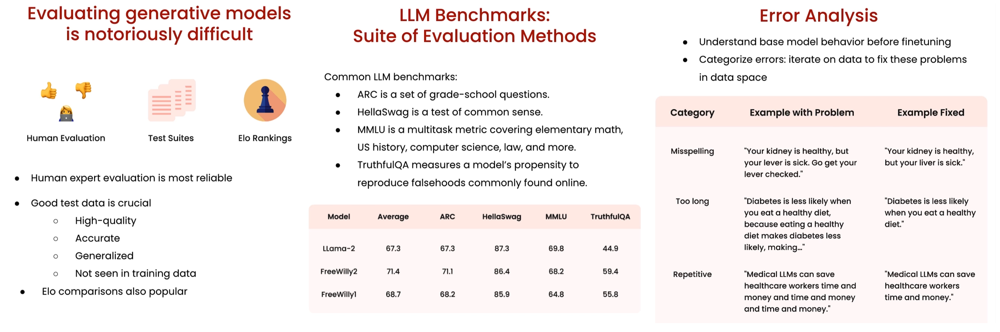

## Lab 6 : Evaluation

### Technically, there are very few steps to run it on GPUs, elsewhere (ie. on Lamini).
```
finetuned_model = BasicModelRunner(
    "lamini/lamini_docs_finetuned"
)
finetuned_output = finetuned_model(
    test_dataset_list # batched!
)
```

### Let's look again under the hood! This is the open core code of Lamini's `llama` library :)

In [53]:
import datasets
import tempfile
import logging
import random
import config
import os
import yaml
import logging
import difflib
import pandas as pd

import transformers
import datasets
import torch

from tqdm import tqdm
from utilities import *
from transformers import AutoTokenizer, AutoModelForCausalLM

logger = logging.getLogger(__name__)
global_config = None

Here we do only on a few samples of our dataset, we can do the same on a more data.

In [54]:
dataset = datasets.load_dataset("lamini/lamini_docs")

test_dataset = dataset["test"]

DEBUG:fsspec.local:open file: /root/.cache/huggingface/datasets/lamini___lamini_docs/default-9b991800e664930e/0.0.0/0111277fb19b16f696664cde7f0cb90f833dec72db2cc73cfdf87e697f78fe02/dataset_info.json
DEBUG:fsspec.local:open file: /root/.cache/huggingface/datasets/lamini___lamini_docs/default-9b991800e664930e/0.0.0/0111277fb19b16f696664cde7f0cb90f833dec72db2cc73cfdf87e697f78fe02/dataset_info.json


In [55]:
print(test_dataset[0]["question"])
print(test_dataset[0]["answer"])

Can Lamini generate technical documentation or user manuals for software projects?
Yes, Lamini can generate technical documentation and user manuals for software projects. It uses natural language generation techniques to create clear and concise documentation that is easy to understand for both technical and non-technical users. This can save developers a significant amount of time and effort in creating documentation, allowing them to focus on other aspects of their projects.


Then I will load the model to run in the entire of this dataset.

In [56]:
model_name = "lamini/lamini_docs_finetuned"
tokenizer = AutoTokenizer.from_pretrained(model_name)
model = AutoModelForCausalLM.from_pretrained(model_name)

### Setup a really basic evaluation function
Below evaluation is very basic, and only check whether there is any exact match.

It is very hard, because there are many possible right answers, so it is not a supper valid evaluation metric.

In [57]:
def is_exact_match(a, b):
    return a.strip() == b.strip()

In [58]:
model.eval()
# it is important to run model.eval() to make sure things like drawback is disabled.

GPTNeoXForCausalLM(
  (gpt_neox): GPTNeoXModel(
    (embed_in): Embedding(50304, 512)
    (emb_dropout): Dropout(p=0.0, inplace=False)
    (layers): ModuleList(
      (0-5): 6 x GPTNeoXLayer(
        (input_layernorm): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
        (post_attention_layernorm): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
        (post_attention_dropout): Dropout(p=0.0, inplace=False)
        (post_mlp_dropout): Dropout(p=0.0, inplace=False)
        (attention): GPTNeoXAttention(
          (rotary_emb): GPTNeoXRotaryEmbedding()
          (query_key_value): Linear(in_features=512, out_features=1536, bias=True)
          (dense): Linear(in_features=512, out_features=512, bias=True)
          (attention_dropout): Dropout(p=0.0, inplace=False)
        )
        (mlp): GPTNeoXMLP(
          (dense_h_to_4h): Linear(in_features=512, out_features=2048, bias=True)
          (dense_4h_to_h): Linear(in_features=2048, out_features=512, bias=True)
          (a

In [60]:
def inference(text, model, tokenizer, max_input_tokens=1000, max_output_tokens=100):
  # Tokenize
  tokenizer.pad_token = tokenizer.eos_token
  input_ids = tokenizer.encode(
      text,
      return_tensors="pt",
      truncation=True,
      max_length=max_input_tokens
  )

  # Generate
  device = model.device
  generated_tokens_with_prompt = model.generate(
    input_ids=input_ids.to(device),
    max_length=max_output_tokens
  )

  # Decode
  generated_text_with_prompt = tokenizer.batch_decode(generated_tokens_with_prompt, skip_special_tokens=True)

  # Strip the prompt
  generated_text_answer = generated_text_with_prompt[0][len(text):]

  return generated_text_answer

### Run model and compare to expected answer

In [61]:
test_question = test_dataset[0]["question"]
generated_answer = inference(test_question, model, tokenizer)
print(test_question)
print(generated_answer)

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


Can Lamini generate technical documentation or user manuals for software projects?
Yes, Lamini can generate technical documentation or user manuals for software projects. This can be achieved by providing a prompt for a specific technical question or question to the LLM Engine, or by providing a prompt for a specific technical question or question. Additionally, Lamini can be trained on specific technical questions or questions to help users understand the process and provide feedback to the LLM Engine. Additionally, Lamini


In [62]:
answer = test_dataset[0]["answer"]
print(answer)

Yes, Lamini can generate technical documentation and user manuals for software projects. It uses natural language generation techniques to create clear and concise documentation that is easy to understand for both technical and non-technical users. This can save developers a significant amount of time and effort in creating documentation, allowing them to focus on other aspects of their projects.


In [63]:
exact_match = is_exact_match(generated_answer, answer)
print(exact_match)

False


The answer is similar, but it is not quite there. There are alot of approaches to evaluate the model output. 
- The exact match also shows it is not perfect.
- There is another approach as well Some juct take the output and put it in another LLM and ask how closely they are. 
- Also we can use embeding to check how close the embeded answer and embeded generated answer are.

### Run over entire dataset

In [64]:
n = 10
metrics = {'exact_matches': []}
predictions = []
for i, item in tqdm(enumerate(test_dataset)):
    print("i Evaluating: " + str(item))
    question = item['question']
    answer = item['answer']

    try:
      predicted_answer = inference(question, model, tokenizer)
    except:
      continue
    predictions.append([predicted_answer, answer])

    #fixed: exact_match = is_exact_match(generated_answer, answer)
    exact_match = is_exact_match(predicted_answer, answer)
    metrics['exact_matches'].append(exact_match)

    if i > n and n != -1:
      break
print('Number of exact matches: ', sum(metrics['exact_matches']))

0it [00:00, ?it/s]The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


i Evaluating: {'question': 'Can Lamini generate technical documentation or user manuals for software projects?', 'answer': 'Yes, Lamini can generate technical documentation and user manuals for software projects. It uses natural language generation techniques to create clear and concise documentation that is easy to understand for both technical and non-technical users. This can save developers a significant amount of time and effort in creating documentation, allowing them to focus on other aspects of their projects.', 'input_ids': [5804, 418, 4988, 74, 6635, 7681, 10097, 390, 2608, 11595, 84, 323, 3694, 6493, 32, 4374, 13, 418, 4988, 74, 476, 6635, 7681, 10097, 285, 2608, 11595, 84, 323, 3694, 6493, 15, 733, 4648, 3626, 3448, 5978, 5609, 281, 2794, 2590, 285, 44003, 10097, 326, 310, 3477, 281, 2096, 323, 1097, 7681, 285, 1327, 14, 48746, 4212, 15, 831, 476, 5321, 12259, 247, 1534, 2408, 273, 673, 285, 3434, 275, 6153, 10097, 13, 6941, 731, 281, 2770, 327, 643, 7794, 273, 616, 6493, 1

1it [00:02,  2.18s/it]The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


i Evaluating: {'question': 'How do I include my API key in the Authorization HTTP header?', 'answer': 'The Authorization HTTP header should include the API key in the following format: Authorization: Bearer <YOUR-KEY-HERE>.', 'input_ids': [2347, 513, 309, 2486, 619, 8990, 2234, 275, 253, 10360, 1320, 17607, 10478, 32, 510, 10360, 1320, 17607, 10478, 943, 2486, 253, 8990, 2234, 275, 253, 1563, 5981, 27, 10360, 1320, 27, 2325, 12287, 654, 58, 11862, 14, 13888, 14, 41, 8147, 13208], 'attention_mask': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], 'labels': [2347, 513, 309, 2486, 619, 8990, 2234, 275, 253, 10360, 1320, 17607, 10478, 32, 510, 10360, 1320, 17607, 10478, 943, 2486, 253, 8990, 2234, 275, 253, 1563, 5981, 27, 10360, 1320, 27, 2325, 12287, 654, 58, 11862, 14, 13888, 14, 41, 8147, 13208]}


2it [00:04,  2.16s/it]The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


i Evaluating: {'question': "Is there a section explaining the code's approach to handling versioning and compatibility?", 'answer': 'Yes, the code includes a version parameter in the FeedbackOperation class constructor, which allows for handling versioning and compatibility.', 'input_ids': [2513, 627, 247, 2593, 15571, 253, 2127, 434, 2746, 281, 10885, 2715, 272, 285, 22862, 32, 4374, 13, 253, 2127, 3797, 247, 2715, 4764, 275, 253, 34600, 2135, 17547, 966, 16757, 13, 534, 4483, 323, 10885, 2715, 272, 285, 22862, 15], 'attention_mask': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], 'labels': [2513, 627, 247, 2593, 15571, 253, 2127, 434, 2746, 281, 10885, 2715, 272, 285, 22862, 32, 4374, 13, 253, 2127, 3797, 247, 2715, 4764, 275, 253, 34600, 2135, 17547, 966, 16757, 13, 534, 4483, 323, 10885, 2715, 272, 285, 22862, 15]}


3it [00:07,  2.56s/it]The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


i Evaluating: {'question': 'Is there a community or support forum available for Lamini users?', 'answer': 'Yes, there is a community forum available for Lamini users. The Lamini community forum can be accessed through the Lamini website and provides a platform for users to ask questions, share ideas, and collaborate with other developers using the library. Additionally, the Lamini team is active on the forum and provides support and guidance to users as needed.', 'input_ids': [2513, 627, 247, 3114, 390, 1329, 12209, 2130, 323, 418, 4988, 74, 4212, 32, 4374, 13, 627, 310, 247, 3114, 12209, 2130, 323, 418, 4988, 74, 4212, 15, 380, 418, 4988, 74, 3114, 12209, 476, 320, 19197, 949, 253, 418, 4988, 74, 4422, 285, 3400, 247, 5147, 323, 4212, 281, 1642, 3533, 13, 3894, 5697, 13, 285, 42124, 342, 643, 12259, 970, 253, 6335, 15, 9157, 13, 253, 418, 4988, 74, 2285, 310, 3939, 327, 253, 12209, 285, 3400, 1329, 285, 12925, 281, 4212, 347, 3058, 15], 'attention_mask': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1,

4it [00:10,  2.93s/it]The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


i Evaluating: {'question': 'Can the Lamini library be utilized for text completion or auto-completion tasks, such as filling in missing words or predicting the next word in a sentence?', 'answer': 'The Lamini library is not specifically designed for text completion or auto-completion tasks. However, it can be used for language modeling and generating text based on a given prompt.', 'input_ids': [5804, 253, 418, 4988, 74, 6335, 320, 12845, 323, 2505, 12240, 390, 6753, 14, 45634, 8892, 13, 824, 347, 12868, 275, 5816, 3000, 390, 21565, 253, 1735, 3159, 275, 247, 6197, 32, 510, 418, 4988, 74, 6335, 310, 417, 5742, 4158, 323, 2505, 12240, 390, 6753, 14, 45634, 8892, 15, 1723, 13, 352, 476, 320, 908, 323, 3448, 14053, 285, 11365, 2505, 1754, 327, 247, 1677, 8959, 15], 'attention_mask': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], 'la

5it [00:12,  2.39s/it]The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


i Evaluating: {'question': 'Are there any costs associated with using Lamini for machine learning tasks, and how does the pricing structure work?', 'answer': 'Lamini offers both free and paid plans for using their machine learning services. The free plan includes limited access to their models and data generator, while the paid plans offer more advanced features and higher usage limits. The pricing structure is based on a pay-as-you-go model, where users are charged based on the number of API requests and data processed. Lamini also offers custom enterprise plans for larger organizations with specific needs.', 'input_ids': [6723, 627, 667, 4815, 2330, 342, 970, 418, 4988, 74, 323, 5145, 4715, 8892, 13, 285, 849, 1057, 253, 20910, 2605, 789, 32, 45, 4988, 74, 6131, 1097, 1959, 285, 5087, 5827, 323, 970, 616, 5145, 4715, 3238, 15, 380, 1959, 2098, 3797, 3710, 2289, 281, 616, 3210, 285, 941, 14156, 13, 1223, 253, 5087, 5827, 3959, 625, 7269, 3386, 285, 2169, 10393, 7787, 15, 380, 20910, 2

6it [00:13,  2.10s/it]The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


i Evaluating: {'question': 'How do I instantiate the LLM engine using the Lamini Python package?', 'answer': 'You can instantiate the LLM engine using the llama module in the Lamini Python package. To do this, you need to import the LLM engine from the llama module, like this: from llama import LLM.', 'input_ids': [2347, 513, 309, 8164, 4513, 253, 21708, 46, 3948, 970, 253, 418, 4988, 74, 13814, 5522, 32, 1394, 476, 8164, 4513, 253, 21708, 46, 3948, 970, 253, 26198, 2902, 6333, 275, 253, 418, 4988, 74, 13814, 5522, 15, 1916, 513, 436, 13, 368, 878, 281, 1395, 253, 21708, 46, 3948, 432, 253, 26198, 2902, 6333, 13, 751, 436, 27, 432, 26198, 2902, 1395, 21708, 46, 15], 'attention_mask': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], 'labels': [2347, 513, 309, 8164, 4513, 253, 21708, 46, 3948, 970, 253, 418, 4988, 74, 13814, 5522, 32, 1394

7it [00:15,  1.94s/it]The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


i Evaluating: {'question': 'Does Lamini provide any mechanisms for model compression or optimization to reduce memory footprint?', 'answer': 'Yes, Lamini provides mechanisms for model compression and optimization to reduce memory footprint. These include techniques such as pruning, quantization, and distillation, which can significantly reduce the size of the model while maintaining its performance. Additionally, Lamini offers support for deploying customized LLMs on edge devices with limited resources, such as mobile phones or IoT devices, through techniques such as model quantization and on-device inference.', 'input_ids': [10795, 418, 4988, 74, 2085, 667, 6297, 323, 1566, 13800, 390, 13757, 281, 4796, 3541, 33257, 32, 4374, 13, 418, 4988, 74, 3400, 6297, 323, 1566, 13800, 285, 13757, 281, 4796, 3541, 33257, 15, 2053, 2486, 5609, 824, 347, 819, 25004, 13, 36643, 13, 285, 940, 21755, 13, 534, 476, 3012, 4796, 253, 1979, 273, 253, 1566, 1223, 11850, 697, 3045, 15, 9157, 13, 418, 4988, 

8it [00:17,  1.82s/it]The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


i Evaluating: {'question': 'How does the performance of LLMs trained using Lamini compare to models fine-tuned with traditional approaches?', 'answer': 'According to the information provided, Lamini allows developers to train high-performing LLMs on large datasets with just a few lines of code from the Lamini library. The optimizations in this library reach far beyond what’s available to developers now, from more challenging optimizations like RLHF to simpler ones like reducing hallucinations. While there is no direct comparison to traditional approaches mentioned, Lamini aims to make training LLMs faster and more accessible to a wider range of developers.', 'input_ids': [2347, 1057, 253, 3045, 273, 21708, 12822, 10166, 970, 418, 4988, 74, 7277, 281, 3210, 4030, 14, 85, 37437, 342, 5899, 7274, 32, 7130, 281, 253, 1491, 2530, 13, 418, 4988, 74, 4483, 12259, 281, 6194, 1029, 14, 468, 14692, 21708, 12822, 327, 1781, 15302, 342, 816, 247, 1643, 3104, 273, 2127, 432, 253, 418, 4988, 74, 633

9it [00:18,  1.73s/it]The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


i Evaluating: {'question': 'Is there any support or community available to help me if I have questions or need assistance while using Lamini?', 'answer': 'Yes, there is a support community available to assist you with any questions or issues you may have while using Lamini. You can join the Lamini Discord server or reach out to the Lamini team directly for assistance.', 'input_ids': [2513, 627, 667, 1329, 390, 3114, 2130, 281, 1361, 479, 604, 309, 452, 3533, 390, 878, 8385, 1223, 970, 418, 4988, 74, 32, 4374, 13, 627, 310, 247, 1329, 3114, 2130, 281, 10073, 368, 342, 667, 3533, 390, 3374, 368, 778, 452, 1223, 970, 418, 4988, 74, 15, 1422, 476, 6604, 253, 418, 4988, 74, 15292, 636, 4771, 390, 3986, 562, 281, 253, 418, 4988, 74, 2285, 3587, 323, 8385, 15], 'attention_mask': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], 'l

10it [00:19,  1.64s/it]The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


i Evaluating: {'question': 'Are there any code samples illustrating how to implement custom logging handlers?', 'answer': 'Yes, the Python logging module documentation provides several examples of how to implement custom logging handlers. You can find them in the official documentation here: https://docs.python.org/3/howto/logging-cookbook.html#developing-new-handlers', 'input_ids': [6723, 627, 667, 2127, 3530, 34805, 849, 281, 3359, 2840, 20893, 40093, 32, 4374, 13, 253, 13814, 20893, 6333, 10097, 3400, 2067, 6667, 273, 849, 281, 3359, 2840, 20893, 40093, 15, 1422, 476, 1089, 731, 275, 253, 3565, 10097, 1060, 27, 5987, 1358, 13880, 15, 16659, 15, 2061, 16, 20, 16, 5430, 936, 16, 36193, 14, 29519, 3305, 15, 2974, 4, 16714, 272, 14, 1826, 14, 4608, 10787], 'attention_mask': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], 'labels': 

11it [00:21,  1.69s/it]The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:0 for open-end generation.


i Evaluating: {'question': 'Are there any code samples illustrating how to handle authentication and authorization?', 'answer': 'Yes, there is a separate section in the documentation explaining authentication, for more information visit https://lamini-ai.github.io/auth/', 'input_ids': [6723, 627, 667, 2127, 3530, 34805, 849, 281, 6016, 19676, 285, 26239, 32, 4374, 13, 627, 310, 247, 4858, 2593, 275, 253, 10097, 15571, 19676, 13, 323, 625, 1491, 4143, 5987, 1358, 77, 4988, 74, 14, 2284, 15, 7280, 15, 900, 16, 14399, 16], 'attention_mask': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], 'labels': [6723, 627, 667, 2127, 3530, 34805, 849, 281, 6016, 19676, 285, 26239, 32, 4374, 13, 627, 310, 247, 4858, 2593, 275, 253, 10097, 15571, 19676, 13, 323, 625, 1491, 4143, 5987, 1358, 77, 4988, 74, 14, 2284, 15, 7280, 15, 900, 16, 14399, 16]}


11it [00:23,  2.17s/it]

Number of exact matches:  0


It shows **Number of exact matches:  0**, and is not that much surprising because it is not a general task. In below we can see how closely the predicted and target answer really are:

In [65]:
df = pd.DataFrame(predictions, columns=["predicted_answer", "target_answer"])
print(df)

                                     predicted_answer  \
0   Yes, Lamini can generate technical documentati...   
1   You can use the Authorization HTTP header to g...   
2   Lamini’s LLM Engine is a LLM Engine for develo...   
3   Yes, there is a community or support forum ava...   
4   Yes, the Lamini library can be utilized for te...   
5   Lamini is designed to be flexible and scalable...   
6   You can instantiate the LLM engine using the L...   
7   Yes, Lamini provides mechanisms for compressio...   
8   The performance of LLMs trained using Lamini c...   
9   Yes, there is a support and community availabl...   
10  Yes, there are some code samples available in ...   
11  Yes, there are some code samples available tha...   

                                        target_answer  
0   Yes, Lamini can generate technical documentati...  
1   The Authorization HTTP header should include t...  
2   Yes, the code includes a version parameter in ...  
3   Yes, there is a community foru

### Evaluate all the data

we can also load the data from hugingface and evaluate it manually.

In [66]:
evaluation_dataset_path = "lamini/lamini_docs_evaluation"
evaluation_dataset = datasets.load_dataset(evaluation_dataset_path)

DEBUG:fsspec:<File-like object HfFileSystem, datasets/lamini/lamini_docs_evaluation@2978042a71b211bdc8ed88b3d13ed28f0554c790/data/train-00000-of-00001-bd9d8bc84c0f9f7c.parquet> read: 0 - 4194304
DEBUG:fsspec:<File-like object HfFileSystem, datasets/lamini/lamini_docs_evaluation@2978042a71b211bdc8ed88b3d13ed28f0554c790/data/train-00000-of-00001-bd9d8bc84c0f9f7c.parquet> read: 86086 - 4280390


Extracting data files:   0%|          | 0/1 [00:00<?, ?it/s]

Generating train split:   0%|          | 0/139 [00:00<?, ? examples/s]

DEBUG:fsspec.local:open file: /root/.cache/huggingface/datasets/lamini___lamini_docs_evaluation/default-038b6742b2f9a3e4/0.0.0/0111277fb19b16f696664cde7f0cb90f833dec72db2cc73cfdf87e697f78fe02.incomplete/lamini_docs_evaluation-train-00000-00000-of-NNNNN.arrow
DEBUG:fsspec.local:open file: /root/.cache/huggingface/datasets/lamini___lamini_docs_evaluation/default-038b6742b2f9a3e4/0.0.0/0111277fb19b16f696664cde7f0cb90f833dec72db2cc73cfdf87e697f78fe02.incomplete/dataset_info.json


In [67]:
pd.DataFrame(evaluation_dataset)

,train
0,"{'predicted_answer': 'Yes, Lamini can generate..."
1,{'predicted_answer': 'You can use the Authoriz...
2,{'predicted_answer': 'Lamini’s LLM Engine is a...
3,"{'predicted_answer': 'Yes, there is a communit..."
4,"{'predicted_answer': 'Yes, the Lamini library ..."
...,...
134,"{'predicted_answer': 'Yes, Lamini has the abil..."
135,{'predicted_answer': 'I wish! This documentati...
136,"{'predicted_answer': 'Yes, Lamini can generate..."
137,"{'predicted_answer': 'Yes, the documentation h..."


### Try the ARC benchmark
Last but not least, we will run **ARC** which is a benchmark, to academically benchmark through different LLMs.
It is good for academic contexts or general model abilities, in this case basically school questions.

It can performs numerous tasks. Maybe some are not related to what your company is care about. The fine tuned models , as can be seen in below, can be tailoured to thousands of different tasks, whuch requires many different waus to evaluating them.

This can take several minutes

In [2]:
!python lm-evaluation-harness/main.py --model hf-causal --model_args pretrained=lamini/lamini_docs_finetuned --tasks arc_easy --device cpu

To run a Python script that uses a specific pre-trained language model ("hf-causal") with additional pre-training data ("lamini/lamini_docs_finetuned") to perform a specific task related to AI reasoning ("arc_easy"). The model is configured to run on the CPU. 

In [76]:
import os
os.listdir("lm-evaluation-harness")

['.flake8',
 'ignore.txt',
 'CITATION.bib',
 '.coveragerc',
 'README.md',
 '.ipynb_checkpoints',
 '.pre-commit-config.yaml',
 'setup.py',
 '.gitignore',
 'CODEOWNERS',
 'main.py',
 'pile_statistics.json',
 'LICENSE.md',
 'requirements.txt',
 'Dockerfile']

In [77]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


The folder named **lm-evaluation-harness** need to be uploaded to below adress.

In [83]:
import os

# Define the path to your Google Drive directory
google_drive_path = '/content/drive/MyDrive'

# List the contents of your Google Drive directory
contents = os.listdir(google_drive_path)

# Print the list of contents
print(contents)

['شنبه سوم شهریور ماه 1386.gdoc', 'lavakhamseh CV.gdoc', 'mtnirc final price ver.2.gsheet', 'te.gsheet', 'RE T3551 key  request ', 'Hamed Lavakhamseh 20131028.pdf', 'psiphon3.ex_', 'Armita Dastan  CV.doc', 'Roya Pouran Shirvani CV .pdf', 'Hamed Lavakhamseh.pdf', 'recom from Huawei.gdoc', 'Scan1.JPG', '122603490-High-Speed-Uplink-Packet-Access-HSUPA-vs-Uplink-Interference.pdf', 'RE  PROBLEM of T6986X new on air site    KRBSCH2.msg', 'Actix Guideline.ppt', 'Audio_10_27_2015_15_18_40_1.m4a', 'Shima Lavakhamseh.docx', 'Hamed Lavakhamseh CV.pdf', 'Dar Emtedad e Shab.mp3', 'Chopin - Nocturne in C#minor.mp3', '02 Test 1, Section 2.mp3', '01 Test 1, Section 1.mp3', '03 Test 1, Section 3.mp3', '04 Test 1, Section 4.mp3', 'Copy of 01 Test 1, Section 1.mp3', '2015 Honda Civic.pdf', 'image.jpg', 'Reading_&_Vocabulary_Development (2).rar', 'Reading_&_Vocabulary_Development (1).rar', 'Reading_&_Vocabulary_Development.rar', 'ATT00001', 'Recommendation Letter.rar', '1. اسکای کام Rev 1.docx', 'Career E

In [8]:
!pip install sacrebleu
!pip install sqlitedict
!pip install omegaconf
!pip install pycountry
!pip install rouge_score
!pip install peft
!pip install pytablewriter

In [10]:
!python /content/drive/MyDrive/lm-evaluation-harness/main.py --model hf-causal --model_args pretrained=lamini/lamini_docs_finetuned --tasks arc_easy --device cpu

2023-09-13 11:24:11.178299: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
Selected Tasks: ['arc_easy']
Using device 'cpu'
Task: arc_easy; number of docs: 2376
Task: arc_easy; document 0; context prompt (starting on next line):
Question: Which is the function of the gallbladder?
Answer:
(end of prompt on previous line)
Requests: [Req_loglikelihood('Question: Which is the function of the gallbladder?\nAnswer:', ' store bile')[0]
, Req_loglikelihood('Question: Which is the function of the gallbladder?\nAnswer:', ' produce bile')[0]
, Req_loglikelihood('Question: Which is the function of the gallbladder?\nAnswer:', ' store digestive enzymes')[0]
, Req_loglikelihood('Question: Which is the function of the gallbladder?\nAnswer:', ' produce digestive enzymes')[0]
]
Running loglikelihood requests
0it [00:00, ?it/s]
{
  "results": {
    "arc_easy": {
      "acc": 0.3122895622895623,
      "acc_stderr": 0.009509325983631455,
      "acc_norm": 0.3

The ARC benchmark shows the score 0.3 that is lower than the score model in the paper, that is 0.36. because it is on company question answering and not the science. If we fine tune it in general tasks, there will be an improvement in this score. Also if we use a larger model.

------------------------------------------------------------------
# Consideration on getting started now


## Practical approach to finetunning

Writing tasks are generallet harder than reading tasks.

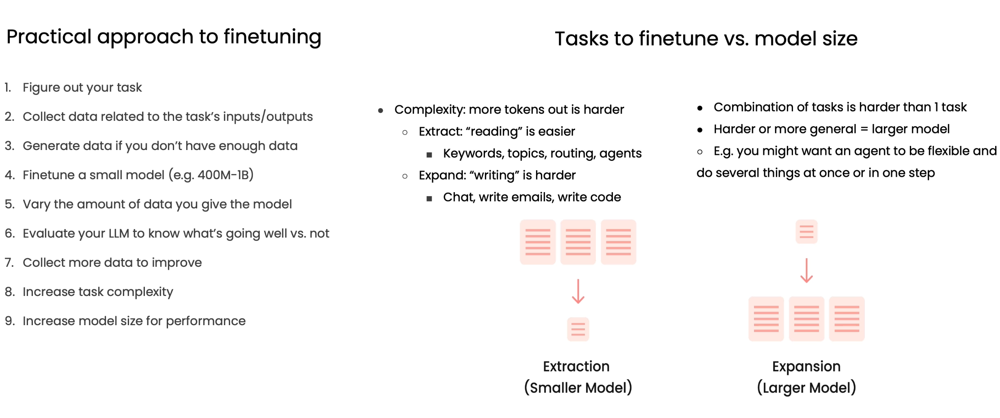

As could be find from below snapshot (right figure), if we need to work with much larger models, there is something call **PEFT** that is set of different methods to do that.

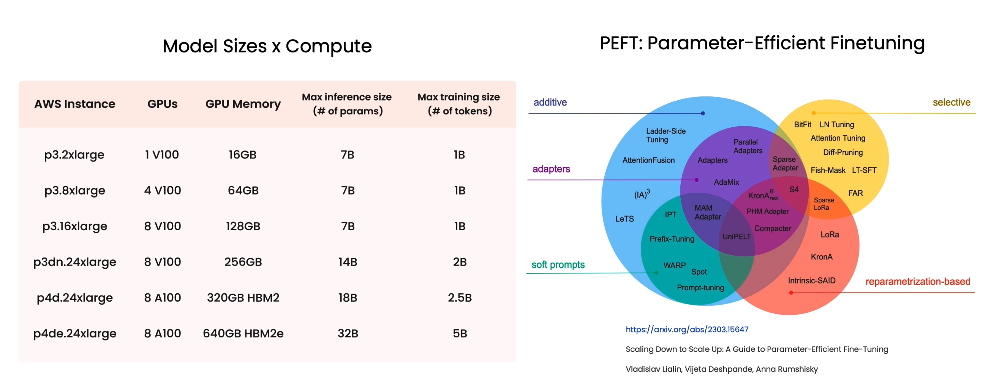

Also we can use **LORA** that reduced considerably the number of parameters and weights you have to train. What actually done with LORA, it creates new weights in some layers when freezing the original weights.
- The important thing about math behind that is : you can train that weights separately / alternatively to the pretrained weights, and then it can merge them back into the main weights, and get that fine-tuned model more efficiently.

- What is exciting about using LORA for is adapting it into new tasks. It means, we can train a model with LORA on one customers data and train another one with another customers data, and then be able to merge them each in an inference time when you need them.

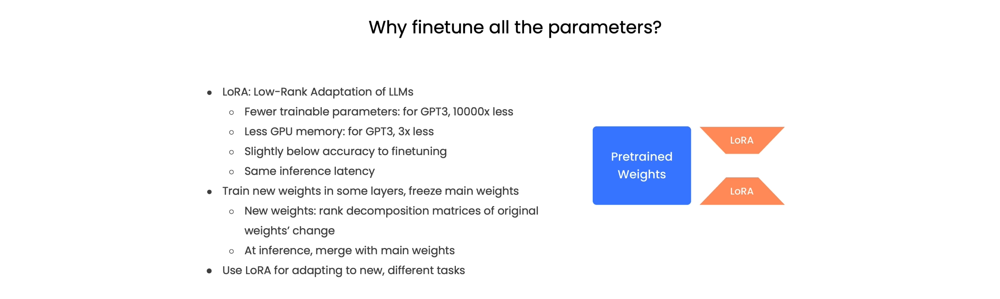